<div style="
    background: linear-gradient(90deg, #17E0BC 0%, #98CE00 50%, #00C1D0 100%);
    padding: 14px;
    border-radius: 10px;
">
  <p style="text-align:center; margin:0;">
    <font size="12px" color="#000000" face="Product Sans">
      <b>Electric Vehicles Market Analysis using Python(Webscrapping)</b>
    </font>
  </p>
</div>


# 🧩 Problem Statement — Electric Vehicle Market and Performance Analysis

### Objective

The electric vehicle (EV) industry is growing rapidly, with new models entering the market each year that vary in price, performance, and efficiency. Understanding how different specifications — such as **battery capacity**, **range**, **efficiency**, and **acceleration** — influence the **market price** can help both manufacturers and consumers make data-driven decisions.

This project aims to **analyze and interpret relationships between EV performance metrics and pricing**, identifying which factors most strongly affect an EV’s market value.

## 🔍 Predictor Features Classification

⚡ **Performance & Efficiency**

| Column Name                                 | Description                                                                               |
| ------------------------------------------- | ----------------------------------------------------------------------------------------- |
| **Battery(kWh)**                              | Energy storage capacity; major factor influencing range and price.                        |
| **Range(km)**                                 | Real-world driving range on a full charge.                                                |
| **Long_distance_range(km)**                   | Extended or highway driving range.                                                        |
| **Efficiency(Wh/km)**                         | Energy consumed per kilometer; lower means better efficiency.                             |
| **Acceleration_time(0-100 Kmph[in seconds])** | Time taken to reach 100 km/h; represents performance.                                     |
| **Fastcharge_power(kW)**                      | Maximum charging rate; determines how quickly the EV can recharge.                        |
| **Range_per_kWh**                             | Measures energy efficiency — how many kilometers per kWh of battery capacity.             |
| **Charging_km_per_min**                       | Measures charging efficiency — how many kilometers are added per minute of fast charging. |


🧰 **Design & Utility**

| Column Name           | Description                                                           |
| --------------------- | --------------------------------------------------------------------- |
| **Weight(kg)**          | Total weight of the vehicle; affects energy consumption and handling. |
| **Seating_capacity**    | Total number of seats available in the vehicle.                       |
| **Towing_capacity(kg)** | Maximum towing capability; reflects vehicle strength and design.      |
| **Cargo_volume(L)**     | Boot/trunk storage space; indicates practicality and usability.       |
| **Car_segment**         | Market category — e.g., SUV, Sedan, Hatchback, Sports, etc.           |

🏢 **Brand & Market Attributes**

| Column Name          | Description                                                   |
| -------------------- | ------------------------------------------------------------- |
| **Brand**              | Manufacturer or company name.                                 |
| **Model**              | Specific model identifier for the EV.                         |
| **Germany_Price(€)**   | Retail price in the German market (reference market).         |
| **Price_per_range(€)** | Indicates cost per kilometer of driving range.                |
| **Price_per_kWh**      | Indicates cost per unit of battery capacity.                  |
| **Price_Category**     | Categorized pricing group — e.g., Economy, Mid-Range, Luxury. |


🧠 **Problem Definition**

To analyze and predict electric vehicle pricing using performance, efficiency, and brand-based features, and uncover the key factors that most influence EV market value.

🔬 **Analytical Approach**
- Perform Exploratory Data Analysis (EDA) to understand feature distributions and correlations.
- Compare brand-level and performance-based insights.
- Visualize relationships between numerical and categorical variables.

---

# 🧩 Step-1: Import Required Libraries

**Before starting EDA, import all essential Python libraries for data analysis and visualization.**

### Why this step?

Before scraping and analyzing EV data, we need to import essential Python libraries:

- **NumPy & Pandas** → For data handling and analysis  
- **Seaborn & Matplotlib** → For visualization
- **Plotly** → For Advanced Data Visualization
- **re (Regex)** → For text pattern cleaning  
- **requests & BeautifulSoup** → For web scraping (sending HTTP requests and parsing HTML)  
- **warnings** → To suppress unnecessary warning messages  

This setup ensures we have all necessary tools for scraping, cleaning, and analyzing EV data efficiently.

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px
from pandas import json_normalize
import requests
import re

from bs4 import BeautifulSoup as bs

import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## 🧩 Step 1.1 — Scrape Car Data from the EV Database

### Purpose
This step iterates through several pages of the EV Database website, extracts details for each electric vehicle (e.g., name, range, efficiency, battery, towing capacity, etc.), and stores them in lists.

### Importance 
This section collects the raw car data that forms the foundation for further cleaning and analysis (EDA).

In [2]:
url='https://ev-database.org/#group=vehicle-group&rs-pr=10000_100000&rs-er=0_1000&rs-ld=0_1000&rs-ac=2_23&rs-dcfc=0_400&rs-ub=10_200&rs-tw=0_2500&rs-ef=100_350&rs-sa=-1_5&rs-w=1000_3500&rs-c=0_5000&rs-y=2010_2030&s=1&p=0-10'

In [3]:
response=requests.get(url)

In [4]:
response

<Response [200]>

In [5]:
pagecontent=response.text

In [6]:
soup=bs(pagecontent)

In [7]:
soup

<!DOCTYPE html>
<html data-locale="en-IE" data-region="si" lang="en">
<!-- head -->
<head>
<meta charset="utf-8"/>
<link href="https://ev-database.org/" rel="canonical"/> <link href="https://ev-database.org/uk/" hreflang="en-gb" rel="alternate"/> <link href="https://ev-database.org/de/" hreflang="de-de" rel="alternate"/> <link href="https://ev-database.org/nl/" hreflang="nl-nl" rel="alternate"/> <link href="https://ev-database.org/" hreflang="x-default" rel="alternate"/> <meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>All electric vehicles in Europe - EV Database</title>
<meta content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." name="description"/>
<meta content="EV Database" property="og:title"/>
<meta content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." property="og:description"/>
<meta content="website" property="og:type"/>
<

In [8]:
brand=[]
for x in soup.find_all("a",attrs={"class":"title"}):
    brand.append(x.text if x else np.nan)

for name in brand: 
    print(name)

MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh
BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive
Tesla Model Y Long Range AWD (Juniper)Tesla Model Y Long Range AWD
BMW iX xDrive40BMW iX xDrive40
Tesla Model Y RWD (Juniper)Tesla Model Y RWD
Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+
Fiat 500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh
CUPRA Born 150 kW - 58 kWhCUPRA Born 150 kW - 58 kWh
Kia EV3 Long RangeKia EV3 Long Range
CUPRA Born 170 kW - 77 kWhCUPRA Born 170 kW - 77 kWh
Renault Twingo E-Tech 27.5 kWhRenault Twingo E-Tech 27.5 kWh
Tesla Model 3 Long Range RWD (Highland)Tesla Model 3 Long Range RWD
Tesla Model 3 RWD (Highland CATL LFP64)Tesla Model 3 RWD
Tesla Model 3 Long Range RWD (Highland)Tesla Model 3 Long Range RWD
Tesla Model 3 Standard Range PlusTesla Model 3 Standard Range Plus
BYD ATTO 3 (MY23-24)BYD ATTO 3
Renault 5 E-Tech 52kWh 150hpRenault 5 E-Tech 52kWh 150hp
Tesla Model Y Long Range AWDTesla Model Y Long Range AWD
BYD SEALION 7 91.3 kWh AWD ExcellenceBYD SEALION 7 91.3 kWh AWD

In [9]:
model=soup.find("span",attrs={"class":"model"})

In [10]:
model

<span class="model">MG4 Electric 64 kWh</span>

In [11]:
model=[]

for x in soup.find_all("span",attrs={"class":"model"}):
    model.append(x.text if x else np.nan)

for name in model: 
    print(name)

MG4 Electric 64 kWh
iX3 50 xDrive (MY26)
Model Y Long Range AWD (Juniper)
iX xDrive40
Model Y RWD (Juniper)
CLA 250+
500e Hatchback 42 kWh
Born 150 kW - 58 kWh
EV3 Long Range
Born 170 kW - 77 kWh
Twingo E-Tech 27.5 kWh
Model 3 Long Range RWD (Highland)
Model 3 RWD (Highland CATL LFP64)
Model 3 Long Range RWD (Highland)
Model 3 Standard Range Plus
ATTO 3 (MY23-24)
5 E-Tech 52kWh 150hp
Model Y Long Range AWD
SEALION 7 91.3 kWh AWD Excellence
Model Y Long Range RWD (Juniper)
ATTO 2
SEALION 7 82.5 kWh RWD Comfort
GLC 400 4MATIC
EX30 Single Motor ER (MY24-26)
B10 67.1 kWh
Model Y Performance
Model Y Standard RWD (Juniper)
Elroq 85 (MY25)
Model Y Premium AWD (Juniper)
EV4 Hatchback 81.4 kWh
Kona Electric 65 kWh
Model Y Long Range RWD
e-tron 55 quattro
T03
6e 68.8 kWh
iX1 xDrive30
IONIQ 5 84 kWh RWD (MY24)
Model 3 Standard Range Plus (PANA 2170L)
iX3 (MY22-24)
Model 3 Performance (Highland)
ID.4 Pro (MY24-25)
Twingo Electric
e-Golf
Niro EV
Model Y Performance (Juniper)
Model 3 Long Range AWD


In [12]:
range_km=soup.find("span",attrs={"class":"erange_real"})

In [13]:
range_km

<span class="erange_real">360 km</span>

In [14]:
speedrange=[]

for x in soup.find_all("span",attrs={"class":"erange_real"}):
    speedrange.append(x.text if x else np.nan)

for name in speedrange: 
    print(name)

360 km
610 km
455 km
360 km
375 km
585 km
235 km
350 km
455 km
450 km
190 km
580 km
440 km
550 km
320 km
330 km
335 km
445 km
440 km
470 km
245 km
420 km
500 km
365 km
360 km
430 km
380 km
450 km
475 km
475 km
390 km
455 km
365 km
225 km
385 km
380 km
450 km
350 km
385 km
490 km
445 km
135 km
190 km
385 km
460 km
455 km
445 km
415 km
260 km
475 km
525 km
300 km
380 km
685 km
560 km
365 km
315 km
350 km
515 km
390 km
235 km
350 km
435 km
490 km
370 km
325 km
265 km
460 km
435 km
380 km
385 km
330 km
275 km
370 km
485 km
345 km
350 km
575 km
405 km
255 km
340 km
465 km
495 km
395 km
390 km
420 km
410 km
255 km
475 km
440 km
530 km
400 km
555 km
480 km
420 km
580 km
440 km
315 km
250 km
330 km
370 km
400 km
720 km
300 km
490 km
575 km
370 km
335 km
490 km
470 km
505 km
165 km
455 km
410 km
450 km
400 km
240 km
375 km
290 km
380 km
180 km
300 km
575 km
455 km
485 km
480 km
390 km
345 km
315 km
360 km
480 km
425 km
510 km
470 km
475 km
280 km
465 km
395 km
430 km
445 km
525 km
400 km
380 km

In [15]:
efficiency=soup.find("span",attrs={"class":"efficiency"})

In [16]:
efficiency

<span class="efficiency">171 Wh/km</span>

In [17]:
Efficiency=[]

for x in soup.find_all("span",attrs={"class":"efficiency"}):
    Efficiency.append(x.text if x else np.nan)

for name in Efficiency: 
    print(name)

171 Wh/km
178 Wh/km
165 Wh/km
197 Wh/km
160 Wh/km
145 Wh/km
159 Wh/km
166 Wh/km
171 Wh/km
171 Wh/km
145 Wh/km
136 Wh/km
136 Wh/km
136 Wh/km
153 Wh/km
183 Wh/km
155 Wh/km
169 Wh/km
208 Wh/km
160 Wh/km
184 Wh/km
196 Wh/km
188 Wh/km
178 Wh/km
181 Wh/km
174 Wh/km
158 Wh/km
171 Wh/km
166 Wh/km
164 Wh/km
168 Wh/km
165 Wh/km
237 Wh/km
160 Wh/km
171 Wh/km
170 Wh/km
178 Wh/km
146 Wh/km
192 Wh/km
153 Wh/km
173 Wh/km
158 Wh/km
168 Wh/km
168 Wh/km
172 Wh/km
162 Wh/km
185 Wh/km
170 Wh/km
168 Wh/km
198 Wh/km
143 Wh/km
153 Wh/km
158 Wh/km
172 Wh/km
170 Wh/km
170 Wh/km
165 Wh/km
173 Wh/km
157 Wh/km
164 Wh/km
161 Wh/km
183 Wh/km
177 Wh/km
192 Wh/km
216 Wh/km
169 Wh/km
163 Wh/km
237 Wh/km
184 Wh/km
170 Wh/km
177 Wh/km
182 Wh/km
159 Wh/km
185 Wh/km
155 Wh/km
165 Wh/km
169 Wh/km
148 Wh/km
189 Wh/km
157 Wh/km
178 Wh/km
155 Wh/km
149 Wh/km
168 Wh/km
166 Wh/km
136 Wh/km
180 Wh/km
172 Wh/km
162 Wh/km
182 Wh/km
182 Wh/km
195 Wh/km
142 Wh/km
181 Wh/km
183 Wh/km
183 Wh/km
175 Wh/km
213 Wh/km
153 Wh/km
178 Wh/km


In [18]:
Weight=soup.find("span",attrs={"class":"weight_p"})
Weight

<span class="weight_p">1726 kg</span>

In [19]:
weight=[]

for x in soup.find_all("span",attrs={"class":"weight_p"}):
    weight.append(x.text if x else np.nan)

for name in weight: 
    print(name)

1726 kg
2360 kg
2072 kg
2440 kg
2003 kg
2055 kg
1365 kg
1811 kg
1885 kg
1946 kg
1200 kg
1822 kg
1836 kg
1822 kg
1684 kg
1825 kg
1504 kg
2054 kg
2510 kg
1976 kg
1645 kg
2300 kg
2535 kg
1850 kg
1920 kg
2072 kg
1981 kg
2115 kg
2072 kg
1890 kg
1773 kg
1959 kg
2565 kg
1250 kg
2037 kg
2085 kg
2060 kg
1700 kg
2255 kg
1929 kg
2144 kg
1186 kg
1615 kg
1757 kg
2108 kg
1931 kg
2260 kg
2105 kg
1511 kg
2535 kg
1899 kg
1410 kg
1711 kg
2545 kg
2265 kg
1755 kg
1577 kg
1733 kg
2125 kg
1760 kg
1345 kg
1970 kg
2090 kg
2415 kg
2495 kg
1800 kg
1465 kg
2705 kg
2190 kg
1940 kg
2015 kg
1815 kg
1563 kg
1695 kg
1919 kg
1984 kg
1975 kg
2135 kg
2125 kg
1430 kg
1825 kg
1919 kg
1985 kg
2045 kg
1940 kg
1836 kg
1985 kg
1491 kg
2172 kg
2160 kg
2210 kg
2069 kg
1899 kg
1917 kg
2145 kg
2462 kg
2075 kg
2145 kg
1602 kg
1785 kg
1820 kg
2000 kg
2435 kg
1710 kg
2154 kg
2170 kg
1979 kg
1637 kg
1919 kg
1919 kg
2585 kg
1009 kg
2141 kg
2109 kg
2121 kg
1835 kg
1542 kg
1812 kg
1636 kg
2264 kg
1440 kg
1623 kg
2260 kg
1981 kg
2246 kg


In [20]:
acceleration=[]

for x in soup.find_all("span",attrs={"class":"acceleration_p"}):
    acceleration.append(x.text if x else np.nan)

for name in acceleration: 
    print(name)

7.9 sec
4.9 sec
4.8 sec
6.1 sec
5.9 sec
6.7 sec
9.0 sec
7.3 sec
7.7 sec
7.0 sec
12.1 sec
5.2 sec
6.1 sec
5.2 sec
5.6 sec
7.3 sec
8.0 sec
5.0 sec
4.5 sec
5.6 sec
7.9 sec
6.7 sec
4.3 sec
5.3 sec
8.0 sec
4.0 sec
7.2 sec
6.6 sec
4.8 sec
7.7 sec
7.8 sec
5.9 sec
5.7 sec
12.7 sec
7.6 sec
5.6 sec
7.5 sec
5.6 sec
6.8 sec
3.4 sec
6.7 sec
12.6 sec
9.6 sec
7.8 sec
3.8 sec
4.6 sec
3.8 sec
8.9 sec
11.0 sec
3.8 sec
4.4 sec
10.6 sec
7.4 sec
6.2 sec
2.4 sec
6.3 sec
11.4 sec
7.0 sec
5.7 sec
7.9 sec
7.3 sec
7.5 sec
6.4 sec
6.0 sec
5.1 sec
7.5 sec
9.1 sec
4.9 sec
6.7 sec
8.6 sec
7.5 sec
6.9 sec
8.0 sec
8.4 sec
4.4 sec
6.9 sec
8.5 sec
4.9 sec
8.5 sec
12.5 sec
7.3 sec
4.4 sec
7.4 sec
8.6 sec
8.3 sec
6.1 sec
7.3 sec
11.5 sec
6.5 sec
5.2 sec
4.9 sec
8.4 sec
4.4 sec
7.9 sec
6.7 sec
3.9 sec
8.6 sec
10.6 sec
9.7 sec
7.6 sec
5.5 sec
8.2 sec
3.2 sec
7.7 sec
7.5 sec
3.2 sec
8.1 sec
7.7 sec
4.4 sec
3.6 sec
4.6 sec
19.1 sec
6.7 sec
8.5 sec
7.6 sec
6.1 sec
8.1 sec
7.8 sec
9.7 sec
4.0 sec
7.3 sec
9.1 sec
5.4 sec
7.6 se

In [21]:
long_distance_total=[]
for x in soup.find_all("span",attrs={"class":"long_distance_total"}):
    long_distance_total.append(x.text if x else np.nan)

for name in long_distance_total: 
    print(name)

405 km
742 km
535 km
388 km
438 km
763 km
261 km
375 km
472 km
488 km
193 km
688 km
520 km
655 km
389 km
325 km
348 km
524 km
502 km
552 km
235 km
440 km
606 km
411 km
403 km
506 km
440 km
493 km
556 km
498 km
391 km
535 km
384 km
212 km
453 km
407 km
560 km
421 km
411 km
585 km
490 km
92 km
178 km
365 km
535 km
560 km
472 km
414 km
270 km
614 km
629 km
311 km
410 km
731 km
636 km
387 km
274 km
338 km
584 km
363 km
222 km
384 km
452 km
630 km
366 km
341 km
275 km
444 km
559 km
405 km
448 km
365 km
312 km
352 km
577 km
409 km
405 km
746 km
430 km
254 km
348 km
534 km
637 km
405 km
418 km
495 km
514 km
270 km
541 km
549 km
677 km
421 km
654 km
481 km
460 km
698 km
468 km
328 km
230 km
350 km
399 km
403 km
836 km
306 km
531 km
653 km
368 km
325 km
584 km
555 km
538 km
151 km
477 km
436 km
445 km
468 km
256 km
349 km
318 km
405 km
183 km
324 km
699 km
484 km
492 km
507 km
363 km
423 km
326 km
352 km
574 km
418 km
564 km
535 km
536 km
299 km
494 km
394 km
471 km
490 km
595 km
493 km
386 km


In [22]:
Battery_kWh=[]
for x in soup.find_all("span",attrs={"class":"battery_p"}):
    Battery_kWh.append(x.text if x else np.nan)

for name in Battery_kWh: 
    print(name)

61.7 kWh
108.7 kWh
75.0 kWh
71.0 kWh
60.0 kWh
85.0 kWh
37.3 kWh
58.0 kWh
78.0 kWh
77.0 kWh
27.5 kWh
79.0 kWh
60.0 kWh
75.0 kWh
49.0 kWh
60.5 kWh
52.0 kWh
75.0 kWh
91.3 kWh
75.0 kWh
45.1 kWh
82.5 kWh
94.0 kWh
65.0 kWh
65.0 kWh
75.0 kWh
60.0 kWh
77.0 kWh
79.0 kWh
78.0 kWh
65.4 kWh
75.0 kWh
86.5 kWh
36.0 kWh
66.0 kWh
64.7 kWh
80.0 kWh
51.0 kWh
74.0 kWh
75.0 kWh
77.0 kWh
21.3 kWh
32.0 kWh
64.8 kWh
79.0 kWh
73.5 kWh
82.5 kWh
70.5 kWh
43.8 kWh
94.0 kWh
75.0 kWh
46.0 kWh
60.0 kWh
118.0 kWh
95.0 kWh
62.1 kWh
52.0 kWh
60.5 kWh
80.7 kWh
64.0 kWh
37.9 kWh
64.0 kWh
77.0 kWh
94.0 kWh
80.0 kWh
55.0 kWh
43.2 kWh
108.8 kWh
80.0 kWh
64.6 kWh
68.0 kWh
60.2 kWh
43.6 kWh
68.3 kWh
75.0 kWh
57.0 kWh
59.0 kWh
85.0 kWh
76.6 kWh
40.0 kWh
60.5 kWh
72.0 kWh
74.0 kWh
66.5 kWh
64.7 kWh
57.0 kWh
74.0 kWh
43.8 kWh
77.0 kWh
80.0 kWh
96.5 kWh
78.0 kWh
79.0 kWh
87.0 kWh
77.0 kWh
106.0 kWh
77.0 kWh
67.0 kWh
38.3 kWh
58.9 kWh
65.0 kWh
79.0 kWh
117.0 kWh
50.8 kWh
85.0 kWh
95.0 kWh
72.0 kWh
57.4 kWh
76.0 kWh
76.0 kWh
105.2

In [23]:
Fastcharge=[]
for x in soup.find_all("span",attrs={"class":"fastcharge_speed_print"}):
    Fastcharge.append(x.text if x else np.nan)

for name in Fastcharge: 
    print(name)

115 kW
225 kW
124 kW
102 kW
110 kW
235 kW
67 kW
82 kW
105 kW
115 kW
40 kW
120 kW
110 kW
124 kW
105 kW
71 kW
70 kW
124 kW
165 kW
124 kW
51 kW
115 kW
190 kW
114 kW
110 kW
124 kW
110 kW
120 kW
120 kW
105 kW
86 kW
124 kW
146 kW
30 kW
120 kW
93 kW
205 kW
105 kW
104 kW
124 kW
120 kW
0 kW
39 kW
70 kW
120 kW
163 kW
100 kW
90 kW
60 kW
260 kW
124 kW
70 kW
87 kW
160 kW
140 kW
90 kW
41 kW
65 kW
131 kW
64 kW
47 kW
100 kW
120 kW
260 kW
100 kW
80 kW
60 kW
100 kW
290 kW
93 kW
130 kW
95 kW
85 kW
82 kW
124 kW
108 kW
110 kW
235 kW
125 kW
51 kW
75 kW
108 kW
200 kW
100 kW
93 kW
108 kW
200 kW
60 kW
125 kW
205 kW
250 kW
115 kW
120 kW
95 kW
120 kW
210 kW
125 kW
75 kW
36 kW
80 kW
90 kW
95 kW
190 kW
68 kW
115 kW
140 kW
85 kW
60 kW
135 kW
135 kW
149 kW
29 kW
120 kW
125 kW
110 kW
100 kW
65 kW
64 kW
78 kW
120 kW
44 kW
85 kW
200 kW
100 kW
130 kW
100 kW
64 kW
150 kW
70 kW
72 kW
180 kW
85 kW
159 kW
136 kW
135 kW
114 kW
126 kW
150 kW
110 kW
120 kW
130 kW
125 kW
80 kW
80 kW
120 kW
200 kW
120 kW
120 kW
108 kW
100 kW
100

In [24]:
Towweight=[]
for x in soup.find_all("span",attrs={"class":"towweight_p"}):
    Towweight.append(x.text if x else np.nan)

for name in Towweight: 
    print(name)

500 kg
2000 kg
1600 kg
2500 kg
1600 kg
1500 kg
0 kg
0 kg
1000 kg
0 kg
0 kg
1000 kg
1000 kg
1000 kg
1000 kg
0 kg
500 kg
1600 kg
1500 kg
1600 kg
750 kg
750 kg
2400 kg
1600 kg
750 kg
1600 kg
1600 kg
1000 kg
1600 kg
1000 kg
750 kg
1600 kg
1800 kg
unknown
1500 kg
1200 kg
1600 kg
1000 kg
750 kg
0 kg
1000 kg
0 kg
0 kg
750 kg
1600 kg
1000 kg
1500 kg
1400 kg
550 kg
2000 kg
1000 kg
unknown
900 kg
750 kg
1600 kg
750 kg
0 kg
0 kg
1600 kg
300 kg
0 kg
750 kg
1000 kg
2000 kg
1800 kg
500 kg
0 kg
1500 kg
1500 kg
750 kg
1600 kg
0 kg
750 kg
500 kg
1000 kg
1600 kg
1000 kg
1800 kg
1000 kg
unknown
750 kg
1000 kg
1500 kg
1500 kg
750 kg
1000 kg
1600 kg
550 kg
1000 kg
1800 kg
unknown
1200 kg
1000 kg
1100 kg
1000 kg
1800 kg
1000 kg
1500 kg
0 kg
0 kg
1600 kg
1500 kg
0 kg
500 kg
0 kg
1600 kg
1500 kg
500 kg
1000 kg
0 kg
2500 kg
0 kg
1000 kg
1000 kg
750 kg
1000 kg
0 kg
300 kg
0 kg
1500 kg
0 kg
0 kg
2100 kg
975 kg
1200 kg
750 kg
0 kg
750 kg
750 kg
1300 kg
1500 kg
1300 kg
2000 kg
1500 kg
0 kg
1800 kg
unknown
0 kg
750

In [25]:
cargo_volume=[]
for x in soup.find_all("span",attrs={"class":"cargo"}):
    cargo_volume.append(x.text if x else np.nan)

for name in cargo_volume: 
    print(name)

363 L
578 L
971 L
500 L
971 L
506 L
185 L
385 L
485 L
385 L
360 L
682 L
682 L
682 L
542 L
440 L
326 L
971 L
578 L
971 L
400 L
578 L
698 L
325 L
430 L
971 L
952 L
470 L
971 L
435 L
493 L
971 L
660 L
210 L
526 L
490 L
577 L
649 L
510 L
682 L
543 L
174 L
341 L
495 L
971 L
542 L
453 L
495 L
361 L
581 L
682 L
351 L
440 L
620 L
798 L
453 L
338 L
345 L
470 L
332 L
260 L
452 L
536 L
605 L
500 L
485 L
308 L
235 L
571 L
460 L
651 L
461 L
566 L
448 L
649 L
971 L
470 L
506 L
520 L
326 L
440 L
649 L
446 L
340 L
490 L
682 L
532 L
310 L
532 L
510 L
475 L
566 L
682 L
545 L
520 L
427 L
585 L
1330 L
357 L
380 L
425 L
839 L
910 L
363 L
505 L
798 L
839 L
479 L
649 L
649 L
500 L
343 L
585 L
543 L
468 L
649 L
496 L
451 L
380 L
435 L
211 L
434 L
529 L
437 L
565 L
453 L
361 L
577 L
420 L
552 L
571 L
552 L
500 L
490 L
385 L
660 L
380 L
555 L
416 L
543 L
470 L
506 L
804 L
480 L
585 L
529 L
446 L
682 L
440 L
895 L
452 L
544 L
588 L
385 L
622 L
588 L
470 L
971 L
697 L
440 L
385 L
280 L
470 L
702 L
200 L
540 L
385

In [26]:
price_per_range=[]
for x in soup.find_all("span",attrs={"class":"priceperrange_p"}):
    price_per_range.append(x.text if x else np.nan)

for name in price_per_range: 
    print(name)

€102 /km
€113 /km
€122 /km
€225 /km
€128 /km
€95 /km
€143 /km
€110 /km
€91 /km
€103 /km
€105 /km
€83 /km
€96 /km
€86 /km
€149 /km
€122 /km
€93 /km
€126 /km
€140 /km
€112 /km
€135 /km
€121 /km
€146 /km
€117 /km
€93 /km
€146 /km
€107 /km
€94 /km
€118 /km
€90 /km
€112 /km
€113 /km
€212 /km
€82 /km
€116 /km
€148 /km
€110 /km
€136 /km
€184 /km
€126 /km
€108 /km
€193 /km
€172 /km
€110 /km
€143 /km
€124 /km
€122 /km
€133 /km
€96 /km
€135 /km
€101 /km
€89 /km
€117 /km
€173 /km
€212 /km
€108 /km
€111 /km
€100 /km
€122 /km
€110 /km
€167 /km
€125 /km
€112 /km
€116 /km
€202 /km
€114 /km
€107 /km
€149 /km
€111 /km
€117 /km
€101 /km
€111 /km
€124 /km
€105 /km
€112 /km
€139 /km
€108 /km
€105 /km
€140 /km
€96 /km
€121 /km
€121 /km
€107 /km
€129 /km
€129 /km
€101 /km
€126 /km
€94 /km
€114 /km
€128 /km
€98 /km
€113 /km
€96 /km
€93 /km
€129 /km
€197 /km
€112 /km
€137 /km
€146 /km
€115 /km
€95 /km
€103 /km
€184 /km
€109 /km
€82 /km
€185 /km
€113 /km
€113 /km
€117 /km
€137 /km
€213 /km
€107 /km
€106 /km
€1

In [27]:
price_in_germany=[]
for x in soup.find_all("span",attrs={"class":"country_de"}):
    price_in_germany.append(x.text if x else np.nan)

for name in price_in_germany: 
    print(name)

€39,990
€68,900
€52,990
€77,300
€45,970
€55,859
€34,990
€39,370
€41,390
€46,450
* €19,000
€45,970
€40,970
€44,990
€46,380
€37,990
€32,900
€55,970
€58,990
€50,970
€31,990
€47,990
€71,281
€44,990
€32,400
€60,970
€40,970
€44,180
€53,970
€43,240
€47,190
€49,970
€81,500
€18,900
€44,900
€55,000
€51,650
€45,560
€67,300
€58,470
€46,335
€28,000
€31,900
€45,690
€62,970
€55,480
€52,990
€53,514
€24,990
N/A
€49,990
€25,400
€46,600
€109,551
€120,970
€42,990
€36,840
€32,990
€59,200
€42,900
€39,000
€42,900
€48,510
N/A
€66,069
€35,990
€30,990
€69,615
€47,600
€43,500
€38,990
N/A
€36,900
€37,990
€53,668
€45,970
€38,680
€60,381
€51,900
N/A
€38,990
€53,560
€54,000
€50,777
€47,900
€40,970
€51,990
€23,300
€53,995
€53,990
N/A
€45,990
€50,970
€47,900
€52,950
€118,600
€48,900
€42,290
€35,350
N/A
€35,995
N/A
€130,900
€34,990
€40,118
€110,970
€41,990
€38,490
€55,260
€59,560
€100,100
€16,900
€48,900
€46,335
€53,490
€44,668
N/A
€42,790
€34,875
€44,900
€35,700
€40,550
€77,250
* €42,000
N/A
€48,990
€41,850
€43,900
€3

In [28]:
no_of_seats = []

for x in soup.find_all("span", attrs={"data-tooltip": "Number of seats"}):
    seat_value = x.find("span")   # <span>5</span>
    no_of_seats.append(seat_value.text.strip() if seat_value else np.nan)

for s in no_of_seats:
    print(s)

5
5
5
5
5
5
4
5
5
4
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
4
5
5
5
5
5
7
5
5
5
4
5
5
5
5
5
5
5
5
4
5
5
5
5
5
4
7
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
4
5
5
4
5
5
7
5
6
5
4
5
5
5
5
5
5
5
5
5
2
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
4
7
4
7
5
5
5
7
5
5
5
5
5
5
5
5
4
7
5
4
4
5
7
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
7
5
5
5
5
5
7
5
7
5
5
5
5
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
5
5
5
5
5
2
5
5
5
4
5
5
5
7
5
7
5
5
5
5
5
5
4
4
5
5
5
5
5
5
5
5
5
5
5
4
5
5
7
5
5
7
5
5
5
7
5
5
5
5
5
5
5
7
5
5
9
5
5
5
5
6
5
5
5
7
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
4
5
5
5
7
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
5
5
5
4
5
5
5
4
7
5
5
5
4
5
5
5
5
4
7
5
5
7
5
5
5
5
7
5
5
4
4
5
5
7
5
5
5
5
5
5
5
5
4
5
5
5
5
5
5
4
6
5
5
4
5
5
5
5
5


In [29]:
market_segment = []

for x in soup.find_all("span", attrs={"data-tooltip": "Market Segment"}):
    market_segment.append(x.text.strip() if x else np.nan)

for ms in market_segment:
    print(ms)

C
D
D
E
D
D
B
C
B
C
A
D
D
D
D
C
B
D
D
D
B
D
D
B
C
D
D
C
D
C
B
D
E
A
D
C
C
D
D
D
C
A
C
C
D
D
D
C
B
D
D
A
C
F
F
C
B
C
D
B
B
C
C
D
D
B
B
E
D
C
C
C
B
B
D
D
C
D
C
B
C
D
D
C
C
D
C
B
E
C
D
C
D
C
C
F
C
N
C
C
C
C
F
C
D
F
C
C
D
D
E
A
C
C
C
D
B
C
C
D
B
B
E
C
C
D
B
C
B
D
D
D
F
E
C
E
F
F
C
C
D
D
F
C
C
E
D
D
D
F
C
C
C
F
E
C
D
D
D
D
C
A
D
D
B
C
C
F
D
F
E
A
D
E
B
B
D
C
D
F
C
A
D
C
D
C
C
D
C
E
D
E
B
C
E
B
C
D
C
E
C
B
C
B
D
E
D
B
F
B
F
D
B
C
C
F
F
A
D
C
C
B
F
B
C
D
C
E
D
B
D
B
C
C
A
B
C
F
D
B
C
B
E
C
E
B
N
C
D
F
B
F
C
E
D
N
C
B
B
C
E
D
E
D
D
C
D
D
N
D
B
B
F
B
B
F
B
F
D
C
F
F
E
D
C
F
F
C
C
F
C
D
E
B
N
C
C
C
F
D
B
C
E
B
N
C
C
C
F
C
B
D
C
F
B
D
C
D
C
E
E
C
E
C
C
B
C
F
A
B
C
C
B
C
S
C
C
B
B
C
D
D
N
C
F
C
D
C
C
C
E
B
B
D
D
B
F
C
C
C
D
C
C
C
B
F
E
F
E
C
F
F
C
D
F
E
E
E
N
F
C
B
E
B
B
N
D
D
D
E
F
B
D
C
N
D
B
E
C
C
E
D
E
F
C
E
E
B
C
F
F
D
B
C
D
C
F
B
C
D
C
F
C
C
C
F
F
F
C
C
C
C
C
C
F
B
C
C
C
C
C
E
N
B
A
C
C
F
F
F
E
C
C
A
C
C
E
D
F
F
F
E
F
F
F
D
C
F
E
C
B
B
C
E
N
C
C
C
B
B
F
C
F
F
F
E
B
N
D
C
B
N
E
B
A
F
E
D
B
E


## 🧩 Step 1.2: Creating a Data Frame

In [30]:
df=pd.DataFrame({"Brand":brand,"Model":model,"Range(km)":speedrange,"Long_distance_range(km)":long_distance_total,"Battery(kWh)":Battery_kWh,"Weight(kg)":weight,"Seating_capacity":no_of_seats,"Car_segment":market_segment,"Acceleration_time(0-100 Kmph[in seconds])":acceleration,"Efficiency(Wh/km)":Efficiency,"Fastcharge_power(kW)":Fastcharge,"Towing_capacity(kg)":Towweight,"Cargo_volume(L)":cargo_volume,"Price_per_range(€)":price_per_range,"Germany_Price(€)":price_in_germany})

print(f"✅ Total records collected: {len(df)}")

✅ Total records collected: 1149


In [31]:
df

,Brand,Model,Range(km),Long_distance_range(km),Battery(kWh),Weight(kg),Seating_capacity,Car_segment,Acceleration_time(0-100 Kmph[in seconds]),Efficiency(Wh/km),Fastcharge_power(kW),Towing_capacity(kg),Cargo_volume(L),Price_per_range(€),Germany_Price(€)
0,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,MG4 Electric 64 kWh,360 km,405 km,61.7 kWh,1726 kg,5,C,7.9 sec,171 Wh/km,115 kW,500 kg,363 L,€102 /km,"€39,990"
1,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,iX3 50 xDrive (MY26),610 km,742 km,108.7 kWh,2360 kg,5,D,4.9 sec,178 Wh/km,225 kW,2000 kg,578 L,€113 /km,"€68,900"
2,Tesla Model Y Long Range AWD (Juniper)Tesla Mo...,Model Y Long Range AWD (Juniper),455 km,535 km,75.0 kWh,2072 kg,5,D,4.8 sec,165 Wh/km,124 kW,1600 kg,971 L,€122 /km,"€52,990"
3,BMW iX xDrive40BMW iX xDrive40,iX xDrive40,360 km,388 km,71.0 kWh,2440 kg,5,E,6.1 sec,197 Wh/km,102 kW,2500 kg,500 L,€225 /km,"€77,300"
4,Tesla Model Y RWD (Juniper)Tesla Model Y RWD,Model Y RWD (Juniper),375 km,438 km,60.0 kWh,2003 kg,5,D,5.9 sec,160 Wh/km,110 kW,1600 kg,971 L,€128 /km,"€45,970"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,Citroën ë-Jumpy Combi M 50 kWhCitroen e-Jumpy ...,ë-Jumpy Combi M 50 kWh,185 km,198 km,46.3 kWh,1969 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,507 L,€270 /km,"€51,940"
1145,Peugeot e-Traveller Compact 50 kWhPeugeot e-Tr...,e-Traveller Compact 50 kWh,185 km,191 km,46.3 kWh,1932 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,unknown,€275 /km,"€50,880"
1146,Fiat E-Ulysse L3 50 kWhFiat E-Ulysse L3 50 kWh,E-Ulysse L3 50 kWh,180 km,191 km,46.3 kWh,1989 kg,8,N,12.1 sec,257 Wh/km,78 kW,1000 kg,800 L,€317 /km,"€56,990"
1147,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,e-Expert Combi Compact 50 kWh,185 km,191 km,46.3 kWh,1932 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,unknown,€243 /km,"€49,080"


In [32]:
df.to_csv("ev.csv",index=False)

In [33]:
df=pd.read_csv("ev.csv")
df

,Brand,Model,Range(km),Long_distance_range(km),Battery(kWh),Weight(kg),Seating_capacity,Car_segment,Acceleration_time(0-100 Kmph[in seconds]),Efficiency(Wh/km),Fastcharge_power(kW),Towing_capacity(kg),Cargo_volume(L),Price_per_range(€),Germany_Price(€)
0,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,MG4 Electric 64 kWh,360 km,405 km,61.7 kWh,1726 kg,5,C,7.9 sec,171 Wh/km,115 kW,500 kg,363 L,€102 /km,"€39,990"
1,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,iX3 50 xDrive (MY26),610 km,742 km,108.7 kWh,2360 kg,5,D,4.9 sec,178 Wh/km,225 kW,2000 kg,578 L,€113 /km,"€68,900"
2,Tesla Model Y Long Range AWD (Juniper)Tesla Mo...,Model Y Long Range AWD (Juniper),455 km,535 km,75.0 kWh,2072 kg,5,D,4.8 sec,165 Wh/km,124 kW,1600 kg,971 L,€122 /km,"€52,990"
3,BMW iX xDrive40BMW iX xDrive40,iX xDrive40,360 km,388 km,71.0 kWh,2440 kg,5,E,6.1 sec,197 Wh/km,102 kW,2500 kg,500 L,€225 /km,"€77,300"
4,Tesla Model Y RWD (Juniper)Tesla Model Y RWD,Model Y RWD (Juniper),375 km,438 km,60.0 kWh,2003 kg,5,D,5.9 sec,160 Wh/km,110 kW,1600 kg,971 L,€128 /km,"€45,970"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,Citroën ë-Jumpy Combi M 50 kWhCitroen e-Jumpy ...,ë-Jumpy Combi M 50 kWh,185 km,198 km,46.3 kWh,1969 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,507 L,€270 /km,"€51,940"
1145,Peugeot e-Traveller Compact 50 kWhPeugeot e-Tr...,e-Traveller Compact 50 kWh,185 km,191 km,46.3 kWh,1932 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,unknown,€275 /km,"€50,880"
1146,Fiat E-Ulysse L3 50 kWhFiat E-Ulysse L3 50 kWh,E-Ulysse L3 50 kWh,180 km,191 km,46.3 kWh,1989 kg,8,N,12.1 sec,257 Wh/km,78 kW,1000 kg,800 L,€317 /km,"€56,990"
1147,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,e-Expert Combi Compact 50 kWh,185 km,191 km,46.3 kWh,1932 kg,9,N,12.1 sec,250 Wh/km,78 kW,1000 kg,unknown,€243 /km,"€49,080"


In [34]:
df.isna().sum()

Brand                                         0
Model                                         0
Range(km)                                     0
Long_distance_range(km)                       0
Battery(kWh)                                  0
Weight(kg)                                    0
Seating_capacity                              0
Car_segment                                   0
Acceleration_time(0-100 Kmph[in seconds])     0
Efficiency(Wh/km)                             0
Fastcharge_power(kW)                          0
Towing_capacity(kg)                           0
Cargo_volume(L)                               0
Price_per_range(€)                            0
Germany_Price(€)                             87
dtype: int64

In [35]:
df.dtypes

Brand                                        object
Model                                        object
Range(km)                                    object
Long_distance_range(km)                      object
Battery(kWh)                                 object
Weight(kg)                                   object
Seating_capacity                              int64
Car_segment                                  object
Acceleration_time(0-100 Kmph[in seconds])    object
Efficiency(Wh/km)                            object
Fastcharge_power(kW)                         object
Towing_capacity(kg)                          object
Cargo_volume(L)                              object
Price_per_range(€)                           object
Germany_Price(€)                             object
dtype: object

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   Brand                                      1149 non-null   object
 1   Model                                      1149 non-null   object
 2   Range(km)                                  1149 non-null   object
 3   Long_distance_range(km)                    1149 non-null   object
 4   Battery(kWh)                               1149 non-null   object
 5   Weight(kg)                                 1149 non-null   object
 6   Seating_capacity                           1149 non-null   int64 
 7   Car_segment                                1149 non-null   object
 8   Acceleration_time(0-100 Kmph[in seconds])  1149 non-null   object
 9   Efficiency(Wh/km)                          1149 non-null   object
 10  Fastcharge_power(kW)                

In [37]:
df.columns

Index(['Brand', 'Model', 'Range(km)', 'Long_distance_range(km)',
       'Battery(kWh)', 'Weight(kg)', 'Seating_capacity', 'Car_segment',
       'Acceleration_time(0-100 Kmph[in seconds])', 'Efficiency(Wh/km)',
       'Fastcharge_power(kW)', 'Towing_capacity(kg)', 'Cargo_volume(L)',
       'Price_per_range(€)', 'Germany_Price(€)'],
      dtype='object')

--- 

# 🔎 Step-2 : Data Cleaning

In [38]:
df['Brand']=df['Brand'].apply(lambda x: re.findall(r'^[^ ]+', x)[0])
df['Brand']

0            MG
1           BMW
2         Tesla
3           BMW
4         Tesla
         ...   
1144    Citroën
1145    Peugeot
1146       Fiat
1147    Peugeot
1148    Peugeot
Name: Brand, Length: 1149, dtype: object

In [39]:
col = 'Brand'  # replace with your actual column name
df.insert(0, col, df.pop(col))

In [40]:
df['Range(km)'] = df['Range(km)'].apply(lambda x: re.findall(r'(\d+)\s*km', x)[0])

In [41]:
df['Range(km)']=df['Range(km)'].astype(int)

In [42]:
df['Long_distance_range(km)'] = df['Long_distance_range(km)'].apply(lambda x: re.findall(r'(\d+)\s*km', x)[0])

In [43]:
df['Long_distance_range(km)']=df['Long_distance_range(km)'].astype(int)

In [44]:
df['Battery(kWh)']=df['Battery(kWh)'].apply(lambda x: re.sub(r'[,\s]*kWh', '', x).replace(',', '.'))

In [45]:
df['Battery(kWh)']=df['Battery(kWh)'].astype(float)

In [46]:
df['Weight(kg)']=df['Weight(kg)'].apply(lambda x: re.sub(r'\s*kg', '', x))

In [47]:
df['Weight(kg)'] = df['Weight(kg)'].apply(lambda x: x.replace(',', '.'))

In [48]:
df['Weight(kg)']=df['Weight(kg)'].astype(float)

In [49]:
df['Acceleration_time(0-100 Kmph[in seconds])'] = df['Acceleration_time(0-100 Kmph[in seconds])'].apply(lambda x: re.sub(r'\s*sec', '', x).replace(',', '-'))

In [50]:
df['Efficiency(Wh/km)'] = df['Efficiency(Wh/km)'].apply(lambda x: re.sub(r'\s*Wh/km', '', x))

In [51]:
df['Efficiency(Wh/km)']=df['Efficiency(Wh/km)'].astype(int)

In [52]:
df['Fastcharge_power(kW)']= df['Fastcharge_power(kW)'].apply(lambda x: re.sub(r'\s*kW', '', x))

In [53]:
df['Fastcharge_power(kW)']=df['Fastcharge_power(kW)'].astype(int)

In [54]:
df['Towing_capacity(kg)'] = df['Towing_capacity(kg)'].apply(lambda x: re.sub(r'[.\s]*kg', '', x).replace('.', ''))

In [55]:
df['Towing_capacity(kg)']. fillna(df['Towing_capacity(kg)']. mode()[0], inplace = True)

In [56]:
# Convert non-numeric values like 'unknown' to NaN
df["Towing_capacity(kg)"] = pd.to_numeric(df["Towing_capacity(kg)"], errors='coerce')

# Replace 0 with NaN (so we can handle both cases together)
df["Towing_capacity(kg)"].replace(0, np.nan, inplace=True)

# Fill NaN with mode value
df["Towing_capacity(kg)"].fillna(df["Towing_capacity(kg)"].mode()[0], inplace=True)

In [57]:
df['Towing_capacity(kg)']=df['Towing_capacity(kg)'].astype(int)

In [58]:
df['Cargo_volume(L)']=df['Cargo_volume(L)'].apply(lambda x: re.sub(r'\s*L', '', x))

In [59]:
# Convert to numeric (turns 'unknown' → NaN)
df['Cargo_volume(L)'] = pd.to_numeric(df['Cargo_volume(L)'], errors='coerce')

# Replace NaN with mode[0] (same style you used earlier)
df['Cargo_volume(L)'].fillna(df['Cargo_volume(L)'].mode()[0], inplace=True)

In [60]:
df['Cargo_volume(L)']=df['Cargo_volume(L)'].astype(int)

In [61]:
df['Price_per_range(€)']=df['Price_per_range(€)'].apply(lambda x: re.sub(r'[€\s]*|/km', '', x))

In [62]:
df['Price_per_range(€)']=df['Price_per_range(€)'].astype(int)

In [63]:
df['Germany_Price(€)']=df['Germany_Price(€)'].apply(lambda x: re.sub(r'[€*,\s]', '', x) if pd.notnull(x) else x)

df['Germany_Price(€)'] = pd.to_numeric(df['Germany_Price(€)'], errors='coerce')

In [64]:
df['Germany_Price(€)'].fillna(df['Germany_Price(€)'].mode()[0], inplace=True)

In [65]:
df['Acceleration_time(0-100 Kmph[in seconds])'] = df['Acceleration_time(0-100 Kmph[in seconds])'].apply(lambda x: x.replace('-', '.')).astype(float)

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Brand                                      1149 non-null   object 
 1   Model                                      1149 non-null   object 
 2   Range(km)                                  1149 non-null   int32  
 3   Long_distance_range(km)                    1149 non-null   int32  
 4   Battery(kWh)                               1149 non-null   float64
 5   Weight(kg)                                 1149 non-null   float64
 6   Seating_capacity                           1149 non-null   int64  
 7   Car_segment                                1149 non-null   object 
 8   Acceleration_time(0-100 Kmph[in seconds])  1149 non-null   float64
 9   Efficiency(Wh/km)                          1149 non-null   int32  
 10  Fastcharge_power(kW)    

In [67]:
df

,Brand,Model,Range(km),Long_distance_range(km),Battery(kWh),Weight(kg),Seating_capacity,Car_segment,Acceleration_time(0-100 Kmph[in seconds]),Efficiency(Wh/km),Fastcharge_power(kW),Towing_capacity(kg),Cargo_volume(L),Price_per_range(€),Germany_Price(€)
0,MG,MG4 Electric 64 kWh,360,405,61.7,1726.0,5,C,7.9,171,115,500,363,102,39990.0
1,BMW,iX3 50 xDrive (MY26),610,742,108.7,2360.0,5,D,4.9,178,225,2000,578,113,68900.0
2,Tesla,Model Y Long Range AWD (Juniper),455,535,75.0,2072.0,5,D,4.8,165,124,1600,971,122,52990.0
3,BMW,iX xDrive40,360,388,71.0,2440.0,5,E,6.1,197,102,2500,500,225,77300.0
4,Tesla,Model Y RWD (Juniper),375,438,60.0,2003.0,5,D,5.9,160,110,1600,971,128,45970.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,Citroën,ë-Jumpy Combi M 50 kWh,185,198,46.3,1969.0,9,N,12.1,250,78,1000,507,270,51940.0
1145,Peugeot,e-Traveller Compact 50 kWh,185,191,46.3,1932.0,9,N,12.1,250,78,1000,385,275,50880.0
1146,Fiat,E-Ulysse L3 50 kWh,180,191,46.3,1989.0,8,N,12.1,257,78,1000,800,317,56990.0
1147,Peugeot,e-Expert Combi Compact 50 kWh,185,191,46.3,1932.0,9,N,12.1,250,78,1000,385,243,49080.0


In [68]:
df.isna().sum()

Brand                                        0
Model                                        0
Range(km)                                    0
Long_distance_range(km)                      0
Battery(kWh)                                 0
Weight(kg)                                   0
Seating_capacity                             0
Car_segment                                  0
Acceleration_time(0-100 Kmph[in seconds])    0
Efficiency(Wh/km)                            0
Fastcharge_power(kW)                         0
Towing_capacity(kg)                          0
Cargo_volume(L)                              0
Price_per_range(€)                           0
Germany_Price(€)                             0
dtype: int64

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Brand                                      1149 non-null   object 
 1   Model                                      1149 non-null   object 
 2   Range(km)                                  1149 non-null   int32  
 3   Long_distance_range(km)                    1149 non-null   int32  
 4   Battery(kWh)                               1149 non-null   float64
 5   Weight(kg)                                 1149 non-null   float64
 6   Seating_capacity                           1149 non-null   int64  
 7   Car_segment                                1149 non-null   object 
 8   Acceleration_time(0-100 Kmph[in seconds])  1149 non-null   float64
 9   Efficiency(Wh/km)                          1149 non-null   int32  
 10  Fastcharge_power(kW)    

In [70]:
df['Weight(kg)'].value_counts()

Weight(kg)
2395.0    10
1969.0    10
2161.0    10
2131.0     9
1530.0     9
          ..
1538.0     1
1270.0     1
1980.0     1
2689.0     1
2460.0     1
Name: count, Length: 515, dtype: int64

## 🔎 Step 2.1 — Data Classification

In [71]:
numeric_cols = [
    "Range(km)",
    "Long_distance_range(km)",
    "Battery(kWh)",
    "Weight(kg)",
    "Seating_capacity",
    "Acceleration_time(0-100 Kmph[in seconds])",
    "Efficiency(Wh/km)",
    "Fastcharge_power(kW)",
    "Towing_capacity(kg)",
    "Cargo_volume(L)",
    "Price_per_range(€)",
    "Germany_Price(€)"
]

In [72]:
def clean_num(value):
    if pd.isna(value):
        return np.nan
    value = str(value)
    value = re.sub(r"[^\d.]", "", value)   # keep only digits + dots
    return float(value) if value else np.nan

In [73]:
for col in numeric_cols:
    df[col] = df[col].apply(clean_num)

In [74]:
df

,Brand,Model,Range(km),Long_distance_range(km),Battery(kWh),Weight(kg),Seating_capacity,Car_segment,Acceleration_time(0-100 Kmph[in seconds]),Efficiency(Wh/km),Fastcharge_power(kW),Towing_capacity(kg),Cargo_volume(L),Price_per_range(€),Germany_Price(€)
0,MG,MG4 Electric 64 kWh,360.0,405.0,61.7,1726.0,5.0,C,7.9,171.0,115.0,500.0,363.0,102.0,39990.0
1,BMW,iX3 50 xDrive (MY26),610.0,742.0,108.7,2360.0,5.0,D,4.9,178.0,225.0,2000.0,578.0,113.0,68900.0
2,Tesla,Model Y Long Range AWD (Juniper),455.0,535.0,75.0,2072.0,5.0,D,4.8,165.0,124.0,1600.0,971.0,122.0,52990.0
3,BMW,iX xDrive40,360.0,388.0,71.0,2440.0,5.0,E,6.1,197.0,102.0,2500.0,500.0,225.0,77300.0
4,Tesla,Model Y RWD (Juniper),375.0,438.0,60.0,2003.0,5.0,D,5.9,160.0,110.0,1600.0,971.0,128.0,45970.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,Citroën,ë-Jumpy Combi M 50 kWh,185.0,198.0,46.3,1969.0,9.0,N,12.1,250.0,78.0,1000.0,507.0,270.0,51940.0
1145,Peugeot,e-Traveller Compact 50 kWh,185.0,191.0,46.3,1932.0,9.0,N,12.1,250.0,78.0,1000.0,385.0,275.0,50880.0
1146,Fiat,E-Ulysse L3 50 kWh,180.0,191.0,46.3,1989.0,8.0,N,12.1,257.0,78.0,1000.0,800.0,317.0,56990.0
1147,Peugeot,e-Expert Combi Compact 50 kWh,185.0,191.0,46.3,1932.0,9.0,N,12.1,250.0,78.0,1000.0,385.0,243.0,49080.0


In [75]:
df.isna().sum()

Brand                                        0
Model                                        0
Range(km)                                    0
Long_distance_range(km)                      0
Battery(kWh)                                 0
Weight(kg)                                   0
Seating_capacity                             0
Car_segment                                  0
Acceleration_time(0-100 Kmph[in seconds])    0
Efficiency(Wh/km)                            0
Fastcharge_power(kW)                         0
Towing_capacity(kg)                          0
Cargo_volume(L)                              0
Price_per_range(€)                           0
Germany_Price(€)                             0
dtype: int64

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149 entries, 0 to 1148
Data columns (total 15 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Brand                                      1149 non-null   object 
 1   Model                                      1149 non-null   object 
 2   Range(km)                                  1149 non-null   float64
 3   Long_distance_range(km)                    1149 non-null   float64
 4   Battery(kWh)                               1149 non-null   float64
 5   Weight(kg)                                 1149 non-null   float64
 6   Seating_capacity                           1149 non-null   float64
 7   Car_segment                                1149 non-null   object 
 8   Acceleration_time(0-100 Kmph[in seconds])  1149 non-null   float64
 9   Efficiency(Wh/km)                          1149 non-null   float64
 10  Fastcharge_power(kW)    

In [77]:
df.shape

(1149, 15)

## 🔎 Step 2.2 — Deriving a new columns

In [78]:
df["Range_per_kWh"] = round(df["Range(km)"] / df["Battery(kWh)"],2)

In [79]:
df["Charging_km_per_min"] = round((df["Fastcharge_power(kW)"] / df["Efficiency(Wh/km)"]) * 60,2)

In [80]:
df["Price_per_kWh"] = round(df["Germany_Price(€)"] / df["Battery(kWh)"],2)

In [81]:
df.columns.tolist()

['Brand',
 'Model',
 'Range(km)',
 'Long_distance_range(km)',
 'Battery(kWh)',
 'Weight(kg)',
 'Seating_capacity',
 'Car_segment',
 'Acceleration_time(0-100 Kmph[in seconds])',
 'Efficiency(Wh/km)',
 'Fastcharge_power(kW)',
 'Towing_capacity(kg)',
 'Cargo_volume(L)',
 'Price_per_range(€)',
 'Germany_Price(€)',
 'Range_per_kWh',
 'Charging_km_per_min',
 'Price_per_kWh']

--- 

# 🧾 Step-3: Saving Cleaned Dataset

In [82]:
df.to_csv("Electric_Vehicles.csv",index=False)

print("✅ Cleaned dataset saved successfully ")

✅ Cleaned dataset saved successfully 


In [83]:
ev_df=pd.read_csv('Electric_Vehicles.csv')
ev_df.head()

,Brand,Model,Range(km),Long_distance_range(km),Battery(kWh),Weight(kg),Seating_capacity,Car_segment,Acceleration_time(0-100 Kmph[in seconds]),Efficiency(Wh/km),Fastcharge_power(kW),Towing_capacity(kg),Cargo_volume(L),Price_per_range(€),Germany_Price(€),Range_per_kWh,Charging_km_per_min,Price_per_kWh
0,MG,MG4 Electric 64 kWh,360.0,405.0,61.7,1726.0,5.0,C,7.9,171.0,115.0,500.0,363.0,102.0,39990.0,5.83,40.35,648.14
1,BMW,iX3 50 xDrive (MY26),610.0,742.0,108.7,2360.0,5.0,D,4.9,178.0,225.0,2000.0,578.0,113.0,68900.0,5.61,75.84,633.85
2,Tesla,Model Y Long Range AWD (Juniper),455.0,535.0,75.0,2072.0,5.0,D,4.8,165.0,124.0,1600.0,971.0,122.0,52990.0,6.07,45.09,706.53
3,BMW,iX xDrive40,360.0,388.0,71.0,2440.0,5.0,E,6.1,197.0,102.0,2500.0,500.0,225.0,77300.0,5.07,31.07,1088.73
4,Tesla,Model Y RWD (Juniper),375.0,438.0,60.0,2003.0,5.0,D,5.9,160.0,110.0,1600.0,971.0,128.0,45970.0,6.25,41.25,766.17


---

# Step-4: Data Visualizations

## Univariate Analysis

### 1.What is the distribution of EV ranges?

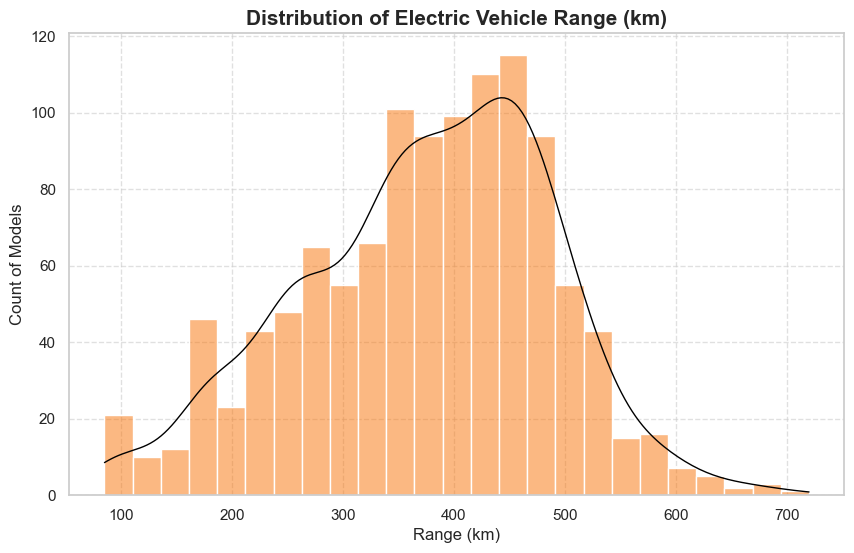

In [115]:
sns.set(style="whitegrid", palette="viridis")

plt.figure(figsize=(10, 6))
sns.histplot(df['Range(km)'], bins=25, kde=True, color='#F97306')
for line in plt.gca().lines:
    line.set_color("black") 
    line.set_linewidth(1)

plt.title("Distribution of Electric Vehicle Range (km)", fontsize=15, weight='bold')
plt.xlabel("Range (km)", fontsize=12)
plt.ylabel("Count of Models", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# Display plot
plt.show();

📊 EV Range Summary:
- Average Range: 374.71 km
- Median Range: 385.00 km
- Shortest Range: 85.0 km
- Longest Range: 720.0 km

💡 Insight:
- Most EVs cluster around the mid-range category, indicating balanced design between affordability and performance.

### 2.What is the price distribution of EVs in Germany?

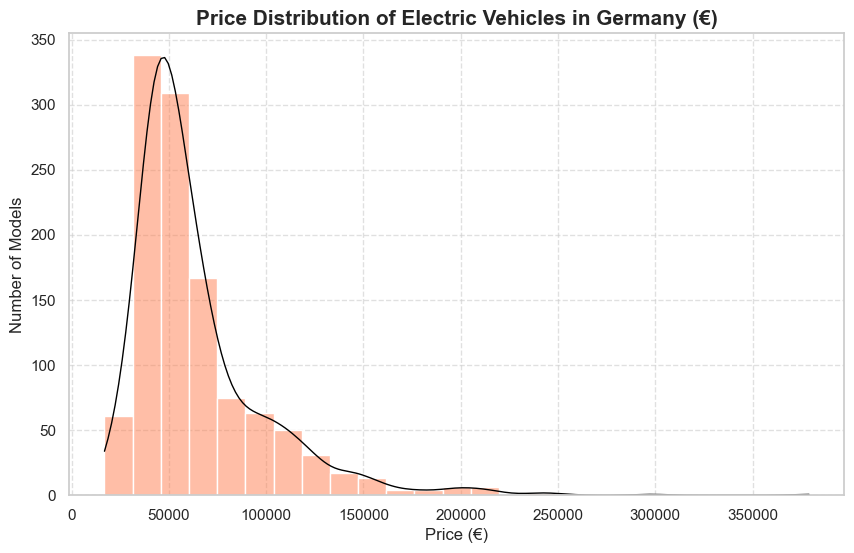

In [116]:
sns.set(style="whitegrid", palette="mako")

# --- Univariate Analysis: Germany_Price(€) ---
plt.figure(figsize=(10, 6))
sns.histplot(df['Germany_Price(€)'], bins=25, kde=True, color='coral')
for line in plt.gca().lines:
    line.set_color("black") 
    line.set_linewidth(1)
    
# Add labels and title
plt.title("Price Distribution of Electric Vehicles in Germany (€)", fontsize=15, weight='bold')
plt.xlabel("Price (€)", fontsize=12)
plt.ylabel("Number of Models", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# Show plot
plt.show();

💶 EV Price Summary (Germany):
- Average Price: €64,525
- Median Price: €53,640
- Lowest Price: €16,900
- Highest Price: €379,015

💡 Insight:
- The Visual Reveals how EVs are spread across budget, mid-range, and luxury categories.

### 3.How efficient are EVs in energy usage?

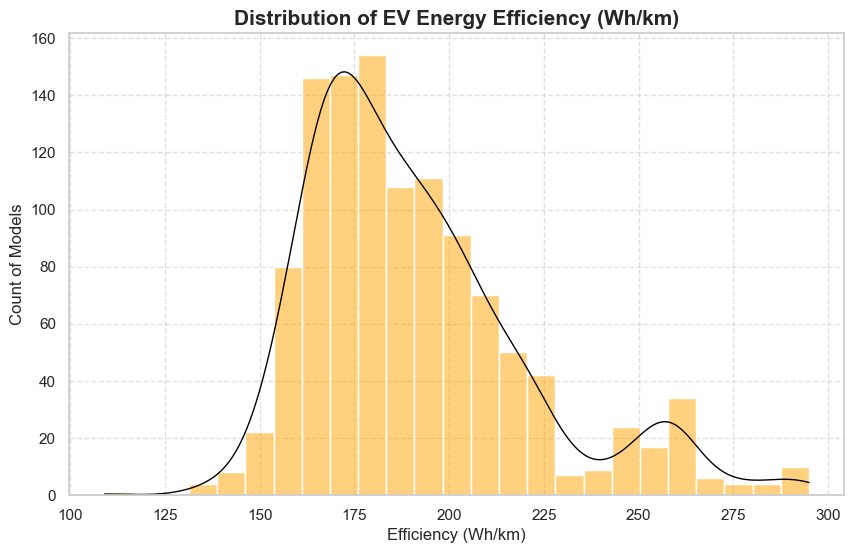

In [117]:
plt.figure(figsize=(10, 6))
sns.histplot(
    df["Efficiency(Wh/km)"],
    bins=25,
    kde=True,
    color="orange"
)
for line in plt.gca().lines:
    line.set_color("black") 
    line.set_linewidth(1)

# Add labels and title
plt.title("Distribution of EV Energy Efficiency (Wh/km)", fontsize=15, weight="bold")
plt.xlabel("Efficiency (Wh/km)", fontsize=12)
plt.ylabel("Count of Models", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Display plot
plt.show();

⚡ EV Efficiency Summary:
- Average Efficiency: 191.20 Wh/km
- Median Efficiency: 184.00 Wh/km
- Most Efficient EV: 109.00 Wh/km
- Least Efficient EV: 295.00 Wh/km

💡 Insight:
- Most EVs cluster around moderate efficiency values (140–180 Wh/km), indicating balanced performance.


### 4.Which brands produce the most EV models?

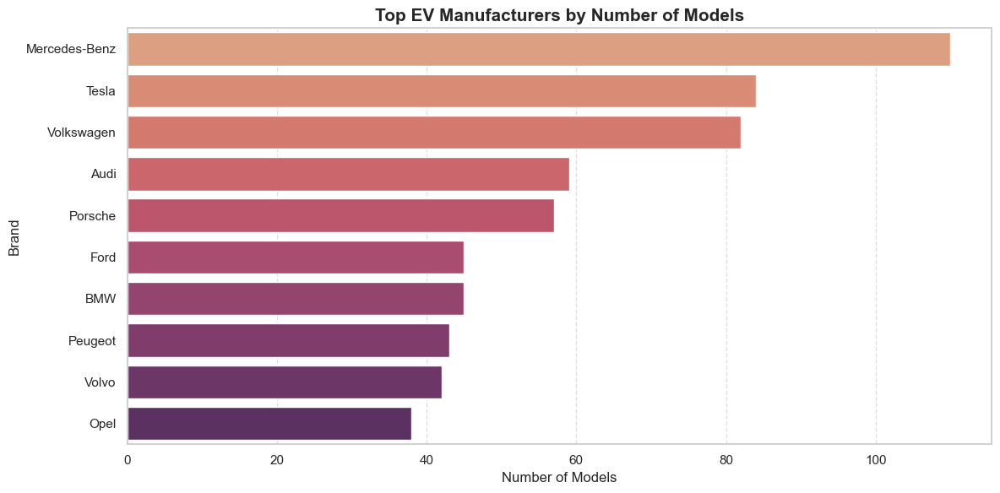

In [118]:
plt.figure(figsize=(12, 6))

# Countplot for brand frequency
brand_order = df["Brand"].value_counts().index  # Sort brands by count
sns.countplot(
    data=df,
    y="Brand",
    order=brand_order[:10],   # Show top 15 brands
    palette="flare"
)

plt.title("Top EV Manufacturers by Number of Models", fontsize=15, weight="bold")
plt.xlabel("Number of Models", fontsize=12)
plt.ylabel("Brand", fontsize=12)
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.tight_layout()

# Display plot
plt.show();

In [88]:
top_brands = df["Brand"].value_counts().head(10)
print("🚗 Top 10 EV Brands by Model Count:")
print(top_brands)

🚗 Top 10 EV Brands by Model Count:
Brand
Mercedes-Benz    110
Tesla             84
Volkswagen        82
Audi              59
Porsche           57
Ford              45
BMW               45
Peugeot           43
Volvo             42
Opel              38
Name: count, dtype: int64


### 5.Which market segments are most represented?

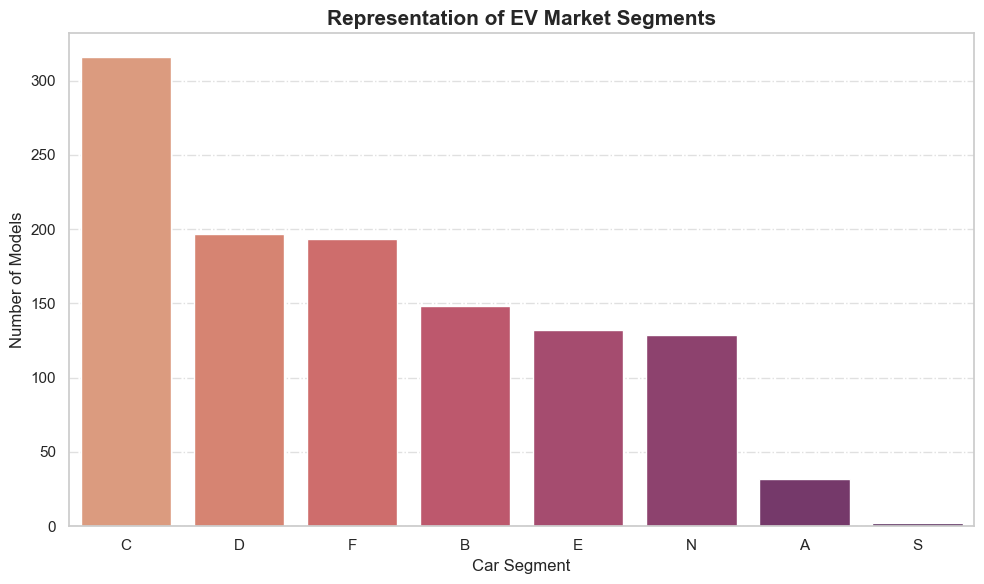

In [119]:
plt.figure(figsize=(10, 6))

# Sort segments by frequency
segment_order = df["Car_segment"].value_counts().index

sns.countplot(
    data=df,
    x="Car_segment",
    order=segment_order,
    palette="flare"
)

# Add labels and title
plt.title("Representation of EV Market Segments", fontsize=15, weight="bold")
plt.xlabel("Car Segment", fontsize=12)
plt.ylabel("Number of Models", fontsize=12)
plt.grid(axis="y", linestyle="-.", alpha=0.6)
plt.xticks()
plt.tight_layout()

# Display plot
plt.show();

In [90]:
print("💡 Insights: \n")
segment_counts = df["Car_segment"].value_counts()
print("🚙 EV Market Segment Counts:")
print(segment_counts)

💡 Insights: 

🚙 EV Market Segment Counts:
Car_segment
C    316
D    197
F    193
B    148
E    132
N    129
A     32
S      2
Name: count, dtype: int64


### 6. What is the price distribution of EVs in Germany?

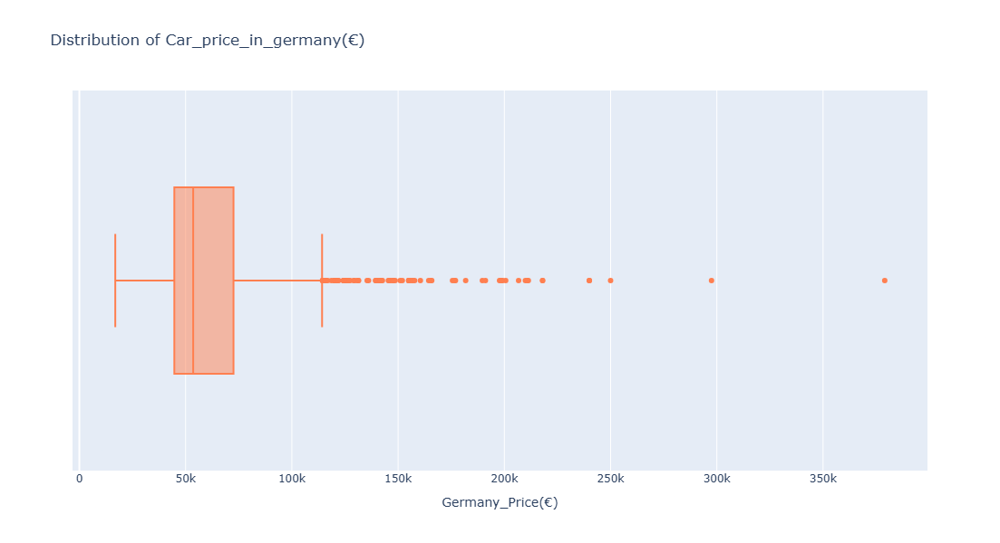

In [122]:
px.box(data_frame=df,x="Germany_Price(€)",
       title="Distribution of Car_price_in_germany(€)",
       width=800,
       height=600,
       color_discrete_sequence=['coral'])

💶 EV Price Summary (Germany):
                
                count      1146.000000
                mean      64485.227749
                std       35445.281809
                min       16900.000000
                25%       44676.000000
                50%       53627.500000
                75%       72579.750000
                max      379015.000000


💡 Insights:

- Most EVs fall within the mid-price range, indicating balanced competition between affordability and premium features.
- A few outliers on the higher end represent luxury or high-performance models like Tesla, Porsche, or BMW EVs.
- The overall distribution suggests that while the EV market still has premium options, affordability and diversity are improving.

### 7.Which car brands dominate the EV market in terms of model availability?

In [92]:
Top_5=top_brands.head(5)
Top_5

Brand
Mercedes-Benz    110
Tesla             84
Volkswagen        82
Audi              59
Porsche           57
Name: count, dtype: int64

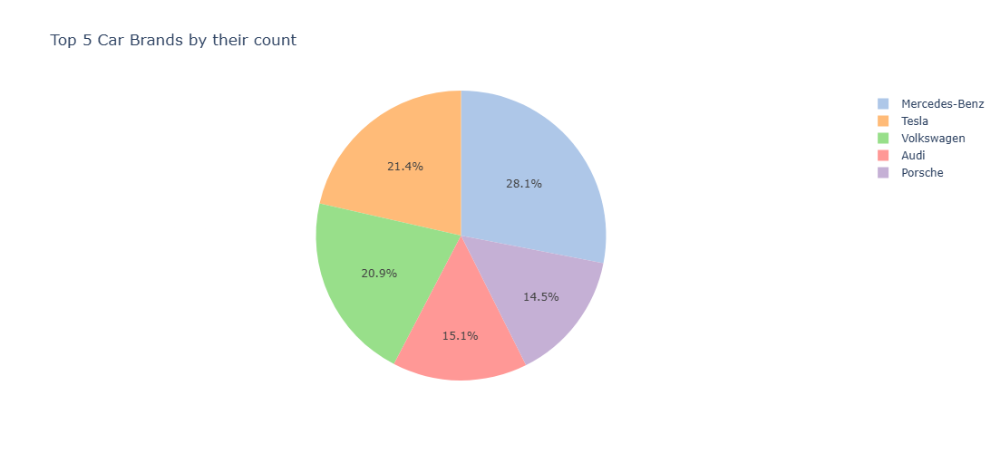

In [123]:
px.pie(data_frame=df,
    names=Top_5.index,
    values=Top_5.values,
    title="Top 5 Car Brands by their count",
    height=500,
    color_discrete_sequence=['#AEC7E8', '#FFBB78', '#98DF8A', '#FF9896', '#C5B0D5'])

🚗 Top 5 EV Brands by Model Count:
                        
                        Brand            Count
                        
                        Mercedes-Benz    110
                        Tesla             84
                        Volkswagen        82
                        Audi              59
                        Porsche           57


💡 Insights:

- The top five brands hold a significant share of the total EV market, indicating strong R&D investment and product diversity.
- A dominant slice (for example,Mercedes-Benz (or) Tesla ) shows market leadership and a well-established EV lineup.
- Smaller slices among the top 5 suggest rising brands that are steadily expanding their EV portfolios.

---

## Bivariate Analysis

### 1. Does a higher battery capacity result in a longer driving range for electric vehicles?

In [94]:
df[['Range(km)','Battery(kWh)']].corr()

,Range(km),Battery(kWh)
Range(km),1.000000,0.900411
Battery(kWh),0.900411,1.000000


In [95]:
fig=px.scatter(data_frame=df,x='Range(km)',y='Battery(kWh)'
           ,trendline='ols', trendline_color_override='mediumorchid',
           title='Range vs Battery Capacity with Trendline',
           width=700,height=500)

fig.update_traces(marker=dict(color='turquoise', size=10, opacity=0.8))
fig.update_layout(template='plotly_white')
fig.show();

🔗 Correlation between Range and Battery Capacity: 0.90

💡 Insights:
- This scatter plot with a trendline shows the relationship between an EV’s battery capacity and its driving range.
- A strong positive correlation indicates that vehicles with larger battery packs generally achieve longer ranges.
- However, data points deviating from the trend suggest efficiency differences — some brands achieve better range per kWh due to advanced energy management or aerodynamics.
- Overall, the plot highlights how energy storage capacity directly influences real-world EV performance, with technology playing a key role in maximizing range.


### 2.Which EV brands provide the most cost-effective range performance in the market?

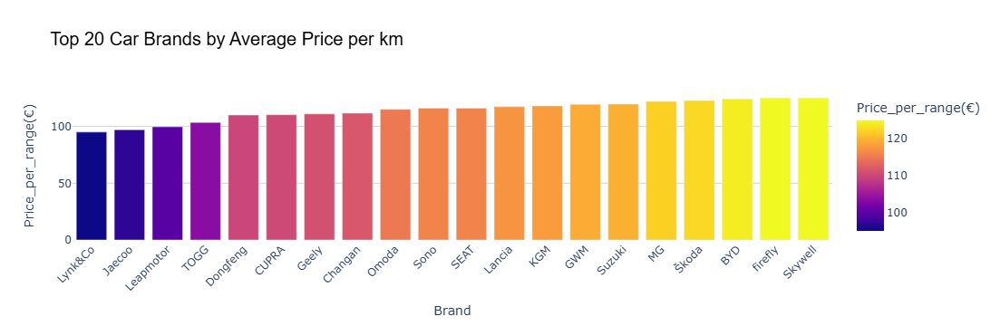

In [126]:
df1 = df.groupby(['Brand'])['Price_per_range(€)'].mean().sort_values().head(20)


df_bar = df1.reset_index()
df_bar.columns = ['Brand', 'Price_per_range(€)']

colors = [
    '#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD',
    '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF',
    '#AEC7E8', '#FFBB78', '#98DF8A', '#FF9896', '#C5B0D5',
    '#C49C94', '#F7B6D2', '#C7C7C7', '#DBDB8D', '#9EDAE5']

fig=px.bar(data_frame=df_bar, x='Brand', y='Price_per_range(€)', 
           color='Price_per_range(€)',
           title="Top 20 Car Brands by Average Price per km",color_discrete_sequence=colors)


fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=False,
    plot_bgcolor='white',
    title_font=dict(size=20, family='Arial', color='black'),
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=True, gridcolor='lightgray')
)

fig.show();

💡 Insights:
- This bar chart visualizes the top 20 EV brands ranked by their average price per kilometer of range.
- Brands positioned lower on the bar (with smaller 'Price_per_range(€)') provide better value, offering more range for less cost.
- Premium or luxury manufacturers like Tesla, BMW, and Mercedes may appear on the higher end, reflecting their focus on performance and brand value.
- Conversely, budget or efficiency-focused brands such as Renault, Hyundai, or BYD tend to deliver better cost efficiency per kilometer.
- This analysis helps consumers and analysts quickly identify brands that balance affordability with driving performance.

### 3.Are higher-priced EVs offering more range?


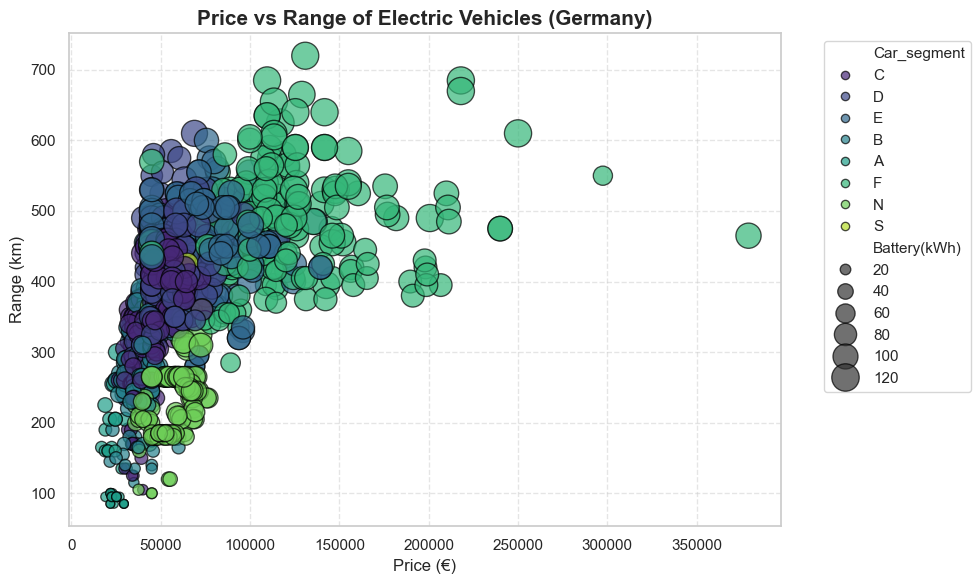

In [127]:
plt.figure(figsize=(10, 6))

# Create a scatter (bubble) plot
sns.scatterplot(
    data=df,
    x="Germany_Price(€)",
    y="Range(km)",
    size="Battery(kWh)",     # bubble size = battery capacity
    hue="Car_segment",       # color = car segment
    sizes=(40, 400),
    alpha=0.7,
    palette="viridis",
    edgecolor="black"
)

# Add title and labels
plt.title("Price vs Range of Electric Vehicles (Germany)", fontsize=15, weight="bold")
plt.xlabel("Price (€)", fontsize=12)
plt.ylabel("Range (km)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Display the plot
plt.show();

In [98]:
correlation = df["Germany_Price(€)"].corr(df["Range(km)"])
print(f"📈 Correlation between Price and Range: {correlation:.2f}")

print("\n💡 Insight:")
if correlation > 0.5:
    print("Higher-priced EVs tend to offer longer driving range — strong positive relationship.")
elif 0.2 < correlation <= 0.5:
    print("Moderate relationship: Some expensive models offer better range, but not always.")
else:
    print("Weak or no relationship: Price doesn't strongly determine range, suggesting brand or design differences.")

📈 Correlation between Price and Range: 0.53

💡 Insight:
Higher-priced EVs tend to offer longer driving range — strong positive relationship.


- A positive trend indicates price–range correlation — expensive EVs generally go farther.
- A flat or scattered pattern means premium pricing (some brands charge more for similar range).
- The bubble size adds a third layer: bigger batteries usually push both price and range upward.

### 4.Does higher charge power lead to faster charging speeds?

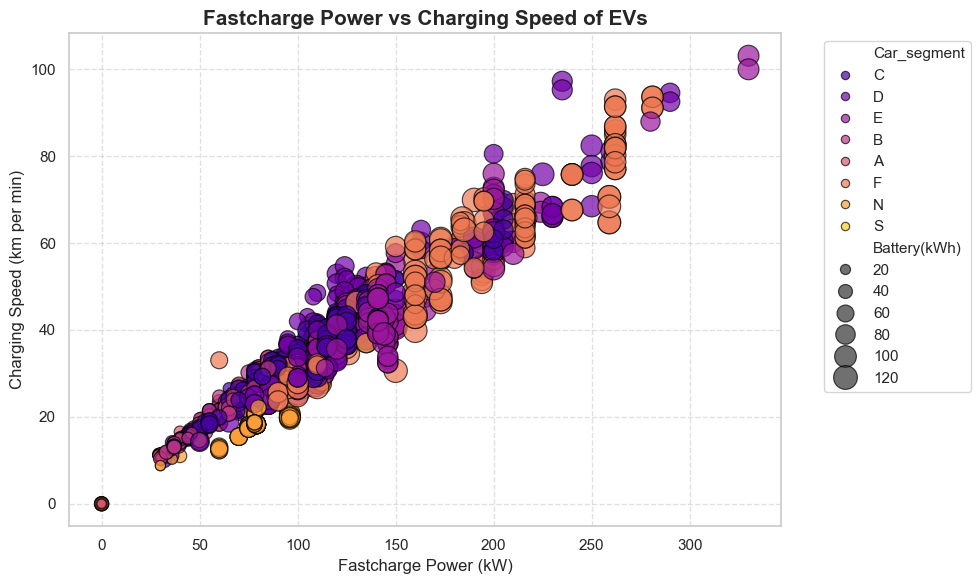

In [128]:
plt.figure(figsize=(10, 6))

sns.scatterplot(
    data=df,
    x="Fastcharge_power(kW)",
    y="Charging_km_per_min",
    hue="Car_segment",       # Color by car segment for additional insight
    size="Battery(kWh)",     # Bubble size = battery capacity (optional)
    sizes=(40, 300),
    alpha=0.7,
    palette="plasma",
    edgecolor="black"
)

# Add labels and title
plt.title("Fastcharge Power vs Charging Speed of EVs", fontsize=15, weight="bold")
plt.xlabel("Fastcharge Power (kW)", fontsize=12)
plt.ylabel("Charging Speed (km per min)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Display the plot
plt.show();

In [100]:
correlation = df["Fastcharge_power(kW)"].corr(df["Charging_km_per_min"])
print(f"⚡ Correlation between Fastcharge Power and Charging Speed: {correlation:.2f}")

print("\n💡 Insight:")
if correlation > 0.7:
    print("Strong positive relationship — higher charging power leads to faster charge speeds.")
elif 0.4 < correlation <= 0.7:
    print("Moderate correlation — generally faster charging with higher power, but efficiency varies by model.")
else:
    print("Weak or no correlation — charging speed doesn’t scale linearly with rated power, likely due to battery management or heat constraints.")

⚡ Correlation between Fastcharge Power and Charging Speed: 0.96

💡 Insight:
Strong positive relationship — higher charging power leads to faster charge speeds.


🧠 Possible Insights

- A strong upward trend = efficient energy conversion → better charging tech (e.g., Porsche Taycan, Tesla).
- A scattered pattern = some EVs underperform despite high power → inefficiency or charging curve limits.
- You can identify segment-level differences — SUVs often have bigger batteries and slower km/min rates than smaller sedans.

### 5.Are expensive EVs always faster?

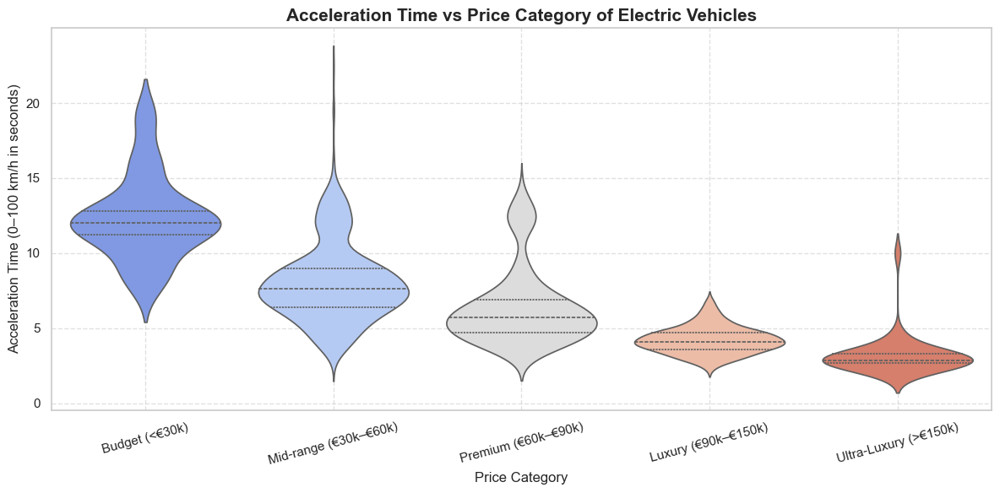

In [129]:
bins = [0, 30000, 60000, 90000, 150000, np.inf]
labels = ['Budget (<€30k)', 'Mid-range (€30k–€60k)', 'Premium (€60k–€90k)', 'Luxury (€90k–€150k)', 'Ultra-Luxury (>€150k)']
df['Price_Category'] = pd.cut(df["Germany_Price(€)"], bins=bins, labels=labels)

# --- Violin Plot ---
plt.figure(figsize=(12, 6))
sns.violinplot(
    data=df,
    x="Price_Category",
    y="Acceleration_time(0-100 Kmph[in seconds])",
    palette="coolwarm",
    inner="quartile"
)

# Add titles and labels
plt.title("Acceleration Time vs Price Category of Electric Vehicles", fontsize=15, weight="bold")
plt.xlabel("Price Category", fontsize=12)
plt.ylabel("Acceleration Time (0–100 km/h in seconds)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.xticks(rotation=15)
plt.tight_layout()

# Display the plot
plt.show();

🏁 Median Acceleration by Price Category:

                Price_Category
                
                Budget (less than €30k)              12.00
                Mid-range (€30k–€60k)                7.65
                Premium (€60k–€90k)                  5.70
                Luxury (€90k–€150k)                  4.10
                Ultra-Luxury (Greater than €150k)    2.85


💡 Insights:
- Luxury and high-end EVs generally achieve lower acceleration times (faster performance).
- Budget and mid-range models show higher acceleration times, focusing more on efficiency and affordability.
- However, a few exceptions exist — some mid-priced EVs deliver surprisingly good acceleration.

### 6.How does cost relate to efficiency per kWh?

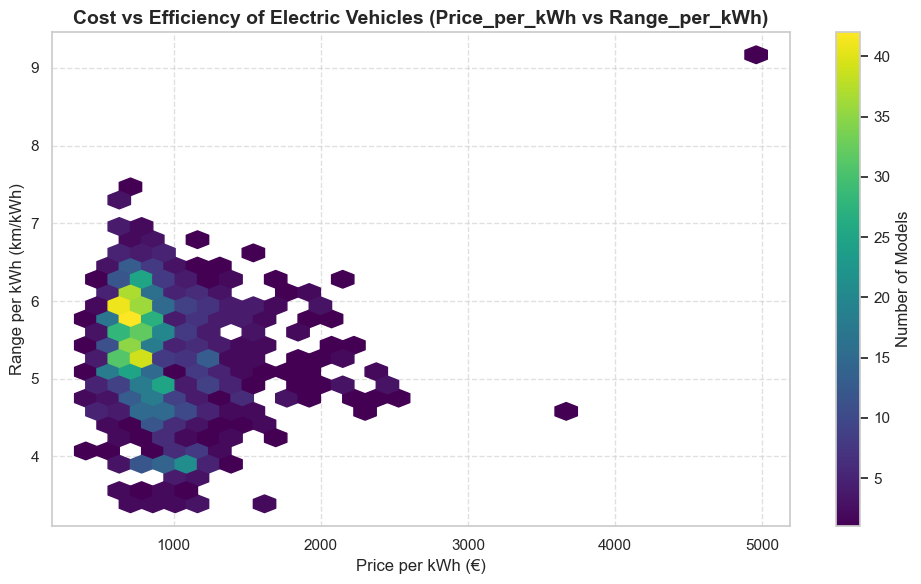

In [130]:
plt.figure(figsize=(10, 6))
hb = plt.hexbin(
    df["Price_per_kWh"], 
    df["Range_per_kWh"],
    gridsize=30,        # smaller = more detailed bins
    cmap="viridis", 
    mincnt=1
)

# Add color bar for density
cb = plt.colorbar(hb)
cb.set_label("Number of Models")

# Add titles and labels
plt.title("Cost vs Efficiency of Electric Vehicles (Price_per_kWh vs Range_per_kWh)", fontsize=14, weight="bold")
plt.xlabel("Price per kWh (€)", fontsize=12)
plt.ylabel("Range per kWh (km/kWh)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show();

🔍 Correlation between Price_per_kWh and Range_per_kWh: -0.12

💡 Insight:
- Lower price-per-kWh models with higher range-per-kWh offer best cost-efficiency. 
- Luxury or performance-oriented EVs often have higher price-per-kWh with lower efficiency due to premium build and performance focus.

### 7.Which segment delivers the highest range?

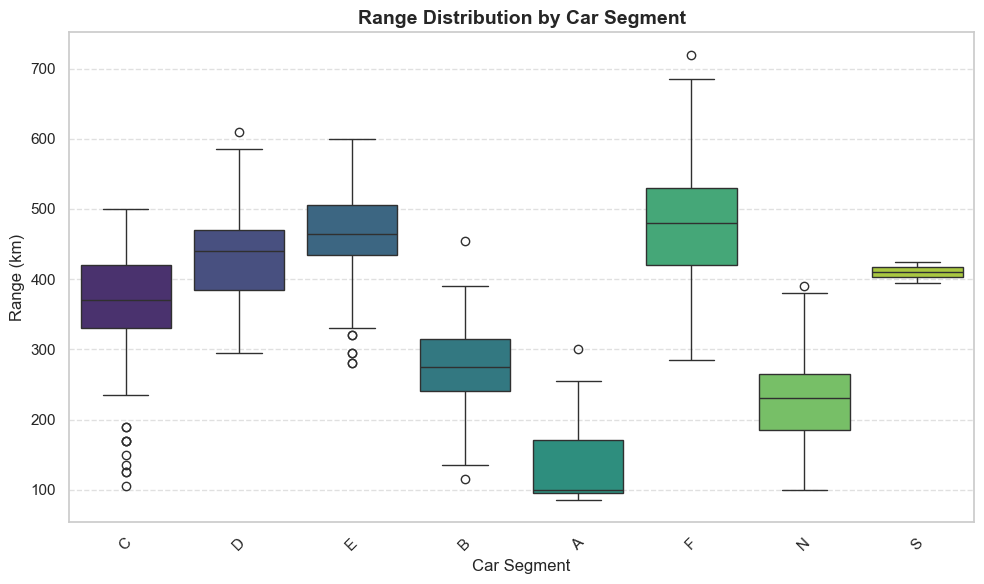

In [131]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x="Car_segment", y="Range(km)", palette="viridis")
plt.title("Range Distribution by Car Segment", fontsize=14, weight='bold')
plt.xlabel("Car Segment")
plt.ylabel("Range (km)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show();

💡 Insight: 

SUVs may show higher median ranges due to larger batteries, while compact EVs or hatchbacks emphasize efficiency over distance.

### 8.Which brand produces the most energy-efficient EVs?

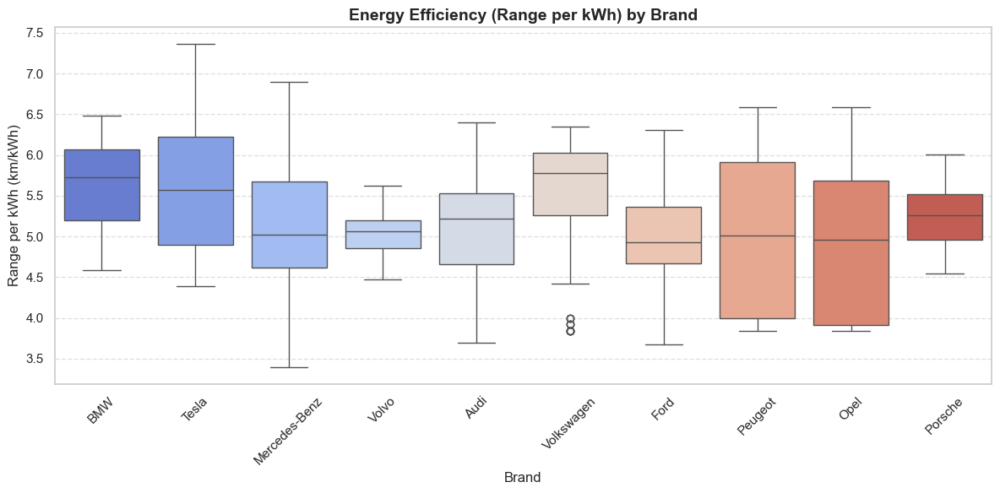

In [132]:
plt.figure(figsize=(12,6))
top_brands = df['Brand'].value_counts().nlargest(10).index
sns.boxplot(data=df[df['Brand'].isin(top_brands)], 
            x="Brand", y="Range_per_kWh", palette="coolwarm")
plt.title("Energy Efficiency (Range per kWh) by Brand", fontsize=14, weight='bold')
plt.xlabel("Brand")
plt.ylabel("Range per kWh (km/kWh)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show();

💡 Insight: 

Brands with higher median range_per_kWh focus on efficiency while premium brands might trade off efficiency for performance.

### 9.Which segments are the most expensive?

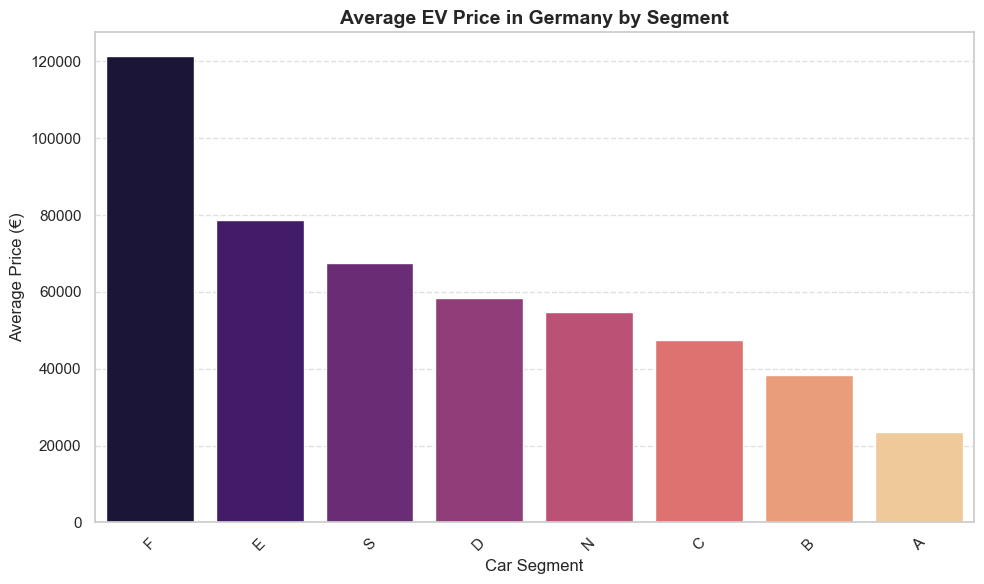

In [133]:
plt.figure(figsize=(10,6))
avg_price = df.groupby("Car_segment")["Germany_Price(€)"].mean().sort_values(ascending=False)
sns.barplot(x=avg_price.index, y=avg_price.values, palette="magma")
plt.title("Average EV Price in Germany by Segment", fontsize=14, weight='bold')
plt.xlabel("Car Segment")
plt.ylabel("Average Price (€)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show();

💡 Insight: 

Luxury and SUV segments dominate higher price tiers, while hatchbacks and compact sedans cater to mid-range consumers.

---

## Multivariate Analysis

### 1.How do key technical and pricing variables in electric vehicles interact with each other?

In [106]:
A=df.groupby(['Brand'])['Range(km)'].mean()
A=A.sort_values(ascending=False).head(20)
A

Brand
Lucid            605.769231
Lightyear        550.000000
Lotus            487.000000
Fisker           467.500000
Rolls-Royce      465.000000
Porsche          461.754386
Polestar         452.500000
XPENG            448.928571
Tesla            440.119048
Mercedes-Benz    438.818182
NIO              425.000000
Audi             421.864407
Voyah            421.666667
BMW              420.666667
CUPRA            413.000000
Škoda            412.702703
Zeekr            408.636364
Hongqi           407.000000
Maserati         405.000000
Cadillac         400.000000
Name: Range(km), dtype: float64

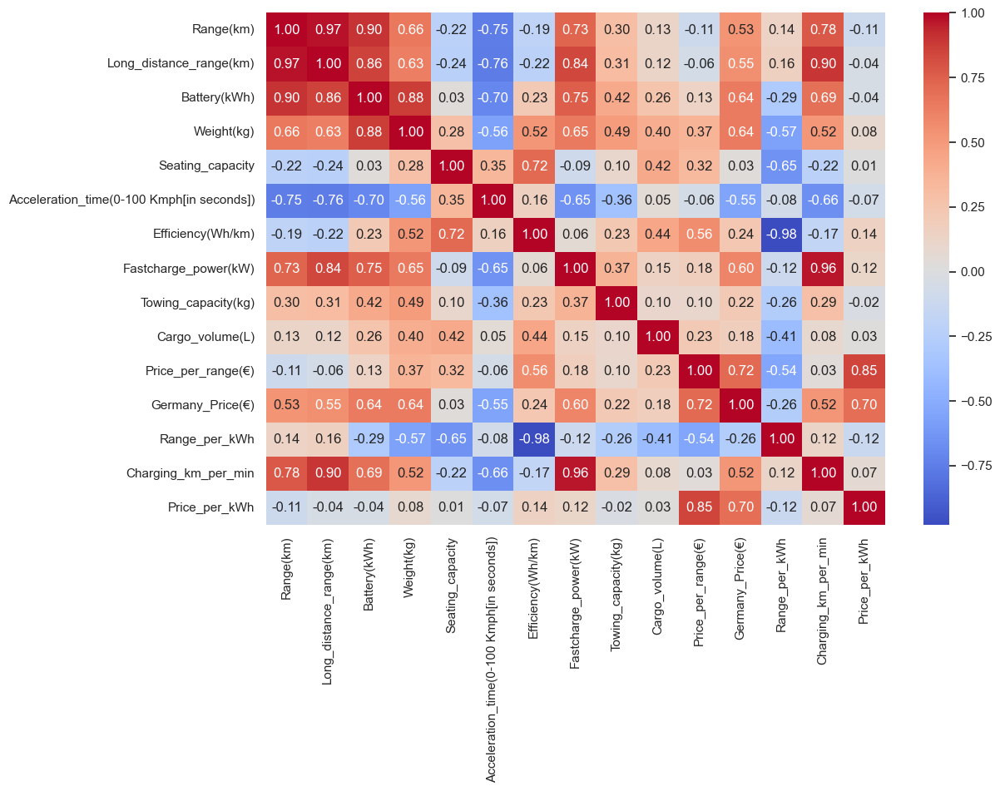

In [134]:
plt.figure(figsize=(12, 8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.show();

💡 Insights:
- The heatmap reveals correlations between numerical attributes such as Range(km), Battery(kWh), Efficiency(Wh/km), and Price metrics.
- Strong positive correlation between 'Range(km)' and 'Battery(kWh)' confirms that larger batteries generally offer longer driving ranges.
- Moderate positive correlation between 'Battery(kWh)' and 'Germany_Price(€)' suggests that higher-capacity EVs tend to be more expensive.
- A negative correlation between 'Efficiency(Wh/km)' and 'Range(km)' indicates that more efficient cars tend to achieve longer ranges with less energy consumption.
- Low correlations with 'Weight(kg)' or 'Cargo_volume(L)' imply that these factors have limited influence on range compared to battery size and efficiency.
- This visualization helps identify which technical attributes most strongly drive performance and pricing in the EV market.

### 2.How do battery size, range, price efficiency, and charging performance interact across different EV models?

In [108]:
fig = px.scatter(df,
    x='Battery(kWh)',
    y='Range(km)',
    size='Price_per_range(€)',               
    color='Charging_km_per_min',       
    hover_name='Brand',
    title='Battery vs Range (Size=Price/km, Color=Charging Speed)',
    opacity=0.8,
    size_max=35,
    color_continuous_scale='Viridis',
    height=650)

fig.update_layout(
    title_x=0.5,
    plot_bgcolor='rgba(245,245,245,1)',
    paper_bgcolor='white',
    font=dict(size=12),
    xaxis_title='Battery Capacity(kWh)',
    yaxis_title='Speed_range(Km)',
    coloraxis_colorbar=dict(title='Charging Speed(km/min)'),
    margin=dict(t=80, b=60, l=60, r=60))

fig.update_traces(marker=dict(line=dict(width=1, color='DarkSlateGrey')))
fig.show();

💡 Insights:
- The bubble chart illustrates how EVs with larger battery capacities generally achieve longer driving ranges, confirming a positive relationship between battery size and range.
- Bubble size (Price_per_range) shows that some high-range EVs are less cost-efficient per km, indicating luxury or performance-oriented models.
- Color intensity (Charging_km_per_min) highlights that newer or premium EVs not only have larger batteries but also support faster charging speeds.
- Brands clustering in the upper-right region represent high-end EVs combining superior range and fast charging — likely from Tesla, Mercedes, or BMW.
- Conversely, smaller bubbles in the lower-left suggest budget or compact EVs optimized for affordability over range or charging speed.
- This visualization effectively reveals trade-offs between price efficiency, range, and charging performance in different EV segments.


### 3. How do range and battery capacity influence price?

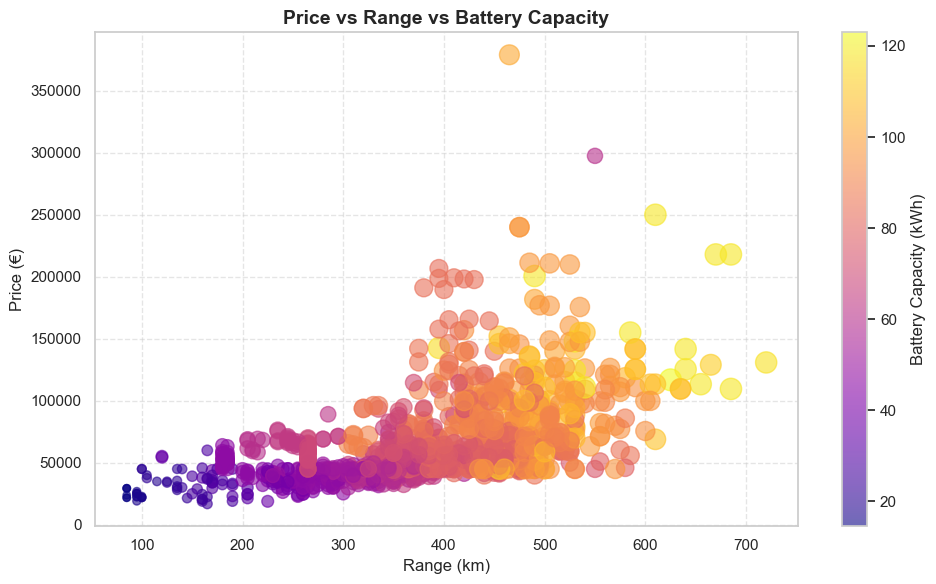

In [135]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Range(km)"], df["Germany_Price(€)"],
            s=df["Battery(kWh)"]*2,  # Bubble size = battery size
            alpha=0.6, c=df["Battery(kWh)"], cmap='plasma')

plt.title("Price vs Range vs Battery Capacity", fontsize=14, weight='bold')
plt.xlabel("Range (km)")
plt.ylabel("Price (€)")
plt.colorbar(label="Battery Capacity (kWh)")
plt.grid(alpha=0.5, linestyle='--')
plt.tight_layout()
plt.show();

💡 Insights:

- Larger batteries usually mean higher prices.
- Mid-priced EVs with decent range are value-optimized.
- Luxury models show higher price with minimal range advantage.
- Outliers with high range & moderate price = best value EVs.

### 4.How do segments manage energy efficiency vs weight?

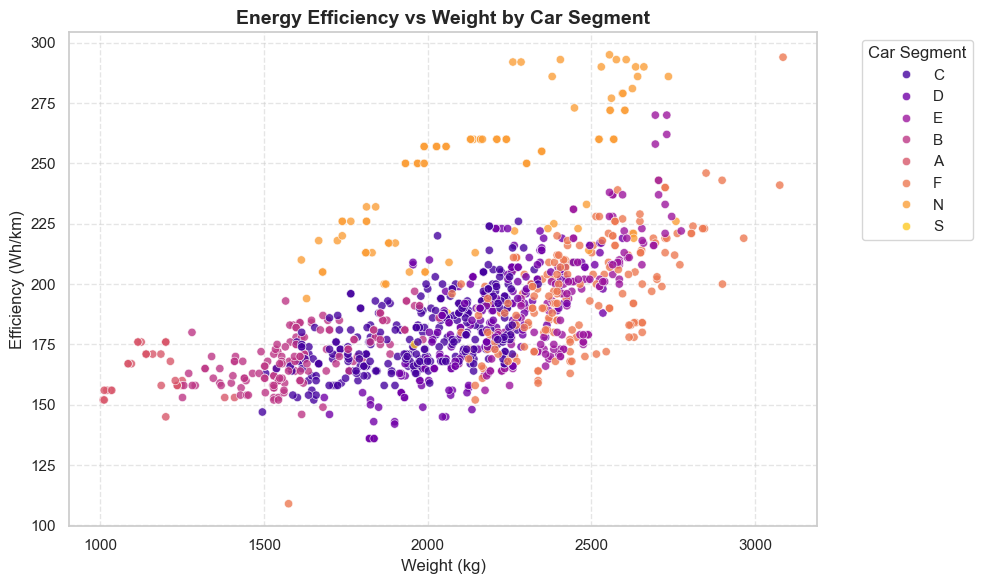

In [136]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, x="Weight(kg)", y="Efficiency(Wh/km)",
    hue="Car_segment", palette="plasma", alpha=0.8
)
plt.title("Energy Efficiency vs Weight by Car Segment", fontsize=14, weight='bold')
plt.xlabel("Weight (kg)")
plt.ylabel("Efficiency (Wh/km)")
plt.grid(alpha=0.5, linestyle='--')
plt.legend(title="Car Segment", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show();


💡 Insights :
- SUVs & vans consume more energy per km.
- Lighter cars (hatchbacks/sedans) show better efficiency.
- Outliers show smart aerodynamic designs in heavier EVs.
- Weight strongly impacts Wh/km, showing engineering trade-offs.

### 5. How do battery size, charging speed, and range interact?

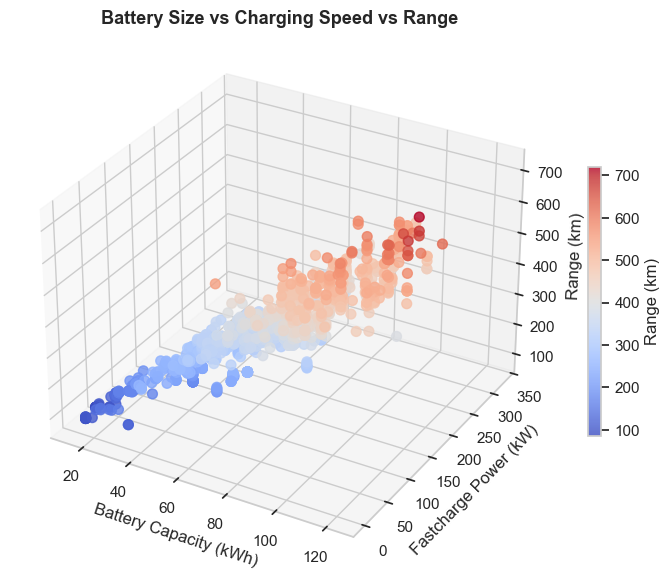

In [137]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

p = ax.scatter(
    df["Battery(kWh)"], df["Fastcharge_power(kW)"], df["Range(km)"],
    c=df["Range(km)"], cmap="coolwarm", s=50, alpha=0.8
)

ax.set_xlabel("Battery Capacity (kWh)")
ax.set_ylabel("Fastcharge Power (kW)")
ax.set_zlabel("Range (km)")
ax.set_title("Battery Size vs Charging Speed vs Range", fontsize=13, weight='bold')

fig.colorbar(p, ax=ax, shrink=0.5, label="Range (km)")
plt.show();


💡 Insights:
- Bigger batteries don’t always charge faster.
- Fastcharge power improves with premium models.
- Efficient EVs achieve higher range even with smaller batteries.
- Reveals optimization between charging tech and battery capacity.

### 6. Which brands balance price and performance best?

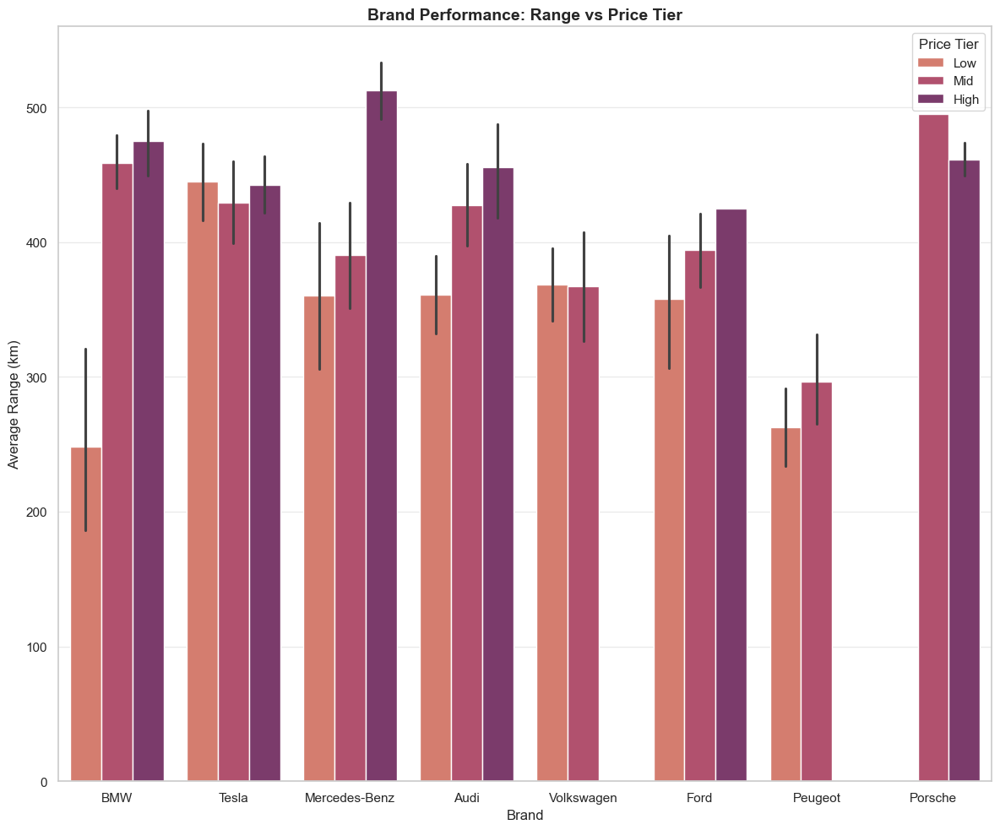

In [138]:
top_brands = df['Brand'].value_counts().nlargest(8).index
brand_data = df[df['Brand'].isin(top_brands)]

plt.figure(figsize=(12, 10))
sns.barplot(
    data=brand_data, x="Brand", y="Range(km)",
    hue=pd.qcut(brand_data["Germany_Price(€)"], 3, labels=["Low", "Mid", "High"]),
    palette="flare"
)
plt.title("Brand Performance: Range vs Price Tier", fontsize=14, weight='bold')
plt.xlabel("Brand")
plt.ylabel("Average Range (km)")
plt.legend(title="Price Tier")
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show();

💡 Insights :
- Top-tier brands dominate range in premium tiers.
- Some brands provide exceptional range even in low-price segments.
- Mid-range price tiers show best value-performance balance.
- Helps visualize brand strategy: luxury vs efficiency focus.

--- 

# 🧠 Step-5: Interpretations & Data-Driven Conclusions

Based on all the analyses and visualizations performed in this notebook, the following interpretations summarize the overall Electric Vehicle (EV) market landscape.



### ✅ Interpretations

- EV Market: Concentrated but Competitive
- Price Reflects Core Performance Features
- Clear Range–Performance Trade-Off
- Energy Efficiency Is Mostly Independent of Price
- Practical Features (Towing & Cargo) Are Secondary
- Market Trend: Modern and Rapidly Evolving

### ✅ Overall Insights
- **Battery capacity is the strongest predictor** of both range and performance.  
- **Performance vs Efficiency trade-off** remains fundamental.  
- **Price tiers (Budget – Mid – Premium)** reflect more on brand and comfort features than pure technical superiority.  
- **EV market diversity** continues to expand, suggesting opportunity for both established automakers and emerging players.

### ✅ **In summary:**  
> The EV landscape is technologically logical, economically layered, and rapidly evolving.  
> Battery size drives capability, while price reflects brand strategy more than physics.

---

# 🏁 Step 6 — Conclusions

After performing comprehensive Exploratory Data Analysis (EDA) on the Electric Vehicle (EV) dataset — including brand distribution, numerical feature exploration, correlation mapping, and multivariate analysis — the following key conclusions can be drawn:



 ⚡Battery Capacity Is the Heart of EV Performance

 🚀 Range and Performance Have an Inverse Relationship

 💰 Price Reflects Technology, Not Just Brand

 🌍 EV Market Is Diverse Yet Concentrated

 🧭 Practical Utility Features Are Still Secondary

 🔋 The EV Industry Is Rapidly Evolving

---

### ✅ Final Takeaway
> The EV market is technologically logical and commercially diverse.  
> **Battery technology defines range and performance**, while **price reflects both innovation and brand positioning**.  
> A clear **trade-off between performance, efficiency, and cost** exists — and mastering that balance will determine the leaders of the next generation of electric mobility.